In [93]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import DataFrame
import pickle
import os
from dtaidistance import dtw, dtw_visualisation as dtwvis

In [94]:
filenames_patients = {
    "cruz_ej1": [
        "cruz_ej1_0",
        "cruz_ej1_3",
        "cruz_ej1_13",
        "cruz_ej1_15",
        "cruz_ej1_35",
        "cruz_ej1_40",
        "cruz_ej1_55",
        "cruz_ej1_57",
        ],
    "cruz_ej2" : [
        "cruz_ej2_1",
        "cruz_ej2_14",
        "cruz_ej2_19",
        "cruz_ej2_23",
        "cruz_ej2_26",
        "cruz_ej2_28",
        "cruz_ej2_29",
        "cruz_ej2_36",
        "cruz_ej2_41",
        "cruz_ej2_45",
        "cruz_ej2_47",
        "cruz_ej2_49",
        "cruz_ej2_53",
        "cruz_ej2_60",
    ],
    "cruz_ej3" : [
        "cruz_ej3_2",
        "cruz_ej3_6",
        "cruz_ej3_10",
        "cruz_ej3_17",
        "cruz_ej3_59",
    ],
    "cruz_ej4" : [
        "cruz_ej4_30",
        "cruz_ej4_31",
        "cruz_ej4_32",
        "cruz_ej4_34",
        "cruz_ej4_38",
        "cruz_ej4_42",
        "cruz_ej4_51",
        "cruz_ej4_54",
    ],
    "pelota1" : [
        "pelota1_4",
        "pelota1_0",
        "pelota1_11",
        "pelota1_17",
        "pelota1_20",
        "pelota1_24",
        "pelota1_30",
        "pelota1_31",
    ],
    "pelota2": [
        "pelota2_12",
        "pelota2_32",
    ]
}   

filenames_correct = {
    "cruz_ej1" : [
        "josemi_cruz1"
    ],
    "cruz_ej2" : [
        "josemi_cruz2"
    ],
    "cruz_ej3" : [
        "josemi_cruz3",
        "joselu_cruz3"
    ],
    "cruz_ej4" : [
        "josemi_cruz4",
    ],
    "pelota1" : [
        "josemi_pelota1",
        "joselu_pelota1",
        "gadea_pelota1"
    ],
    "pelota2" : [
        "josemi_pelota2",
        "joselu_pelota2",
        "gadea_pelota2"
    ]
}

def get_filenames_patients(exercise: str, df = True):
    extension = ".df"
    if not df:
        extension = ".csv"
    
    sufix = ".pos"
    dataframes = []
    for i in filenames_patients[exercise]:
        actual_df =  i + sufix + extension
        dataframes.append(actual_df)
    return dataframes

def get_filenames_profesionals(exercise: str):
    sufix = ".df"
    dataframes = []
    for i in filenames_correct[exercise]:
        actual_df = i + sufix
        dataframes.append(actual_df)
    return dataframes


In [95]:
import PosicionVF
from PosicionVF import Posicion

DATA_DIR = "../datos"
CSV_DIR = "CSV"
DATAFRAME_DIR = "DataFrames"
PROFESIOLS_DIR = "Correctos"
NORMALIZED = "normalized"
#NORMALIZED= ""
def open_dataframe(df_name):
    df: DataFrame
    df_name = os.path.join(NORMALIZED, DATAFRAME_DIR, df_name)
    
    with open(df_name, 'rb') as fp:
        df = pd.read_pickle(fp)
    df = df.dropna(subset=df.columns.values)
    df = df.reset_index(drop=True)
    return df

def open_numpy(numpy_name):
    file = None
    numpy_name = os.path.join(NORMALIZED, PROFESIOLS_DIR, numpy_name)

    with open(numpy_name, 'rb') as fp:
        file = pd.read_pickle(fp)
    file = file.dropna(subset=file.columns.values)
    file = file.reset_index(drop=True)
    return file

In [96]:
USEDPARTS = "userparts"
def saved_used_parts(ej, parts):
    filename_df =  os.path.join(USEDPARTS) + ".df"
    filename_csv =  os.path.join(USEDPARTS) + ".json"
    data = pd.DataFrame({})   
    with open(filename_df, "ab") as file:
        pass
    with open(filename_df, "rb") as file:
        try:
            data = pickle.load(file)
        except:
            pass
    with open(filename_df, "wb") as file:
        data[ej] = {"angles": parts}
        pickle.dump(data, file, protocol=pickle.HIGHEST_PROTOCOL)
        data.to_json(filename_csv)

def open_used_parts(ej):
    filename_df =  os.path.join(USEDPARTS) + ".df"
    with open(filename_df, "rb") as file:
        try:
            data = pickle.load(file)
            return data[ej]
        except:
            pass


# Cruz_ej1

In [98]:
angles_cruz_ej1 = [
    'angCaderaI', 
    'angCaderaD', 
    'angCaderaTorsoI', 
    'angCaderaTorsoD',
    'angRodillaI', 
    'angRodillaD'
]
saved_used_parts("cruz_ej1", angles_cruz_ej1)

# Cruz_ej2

En este ejercicio las zonas que hay que evaluar son las de las partes inferiores.

In [99]:
angles_cruz_ej2 = [
    'angCaderaI', 
    'angCaderaD', 
    'angCaderaTorsoI', 
    'angCaderaTorsoD',
    'angRodillaI', 
    'angRodillaD'
]
saved_used_parts("cruz_ej2", angles_cruz_ej2)

In [100]:
dataframes_cruz_ej2_patients = get_filenames_patients("cruz_ej2")
dataframes_cruz_ej2_patients = dataframes_cruz_ej2_patients[:3]
cruz_ej2_patients = {}
for ej2 in dataframes_cruz_ej2_patients:
    temp = open_dataframe(ej2)
    temp = temp[angles_cruz_ej2]
    cruz_ej2_patients[ej2] = temp

dataframes_cruz_ej2_profesionals = get_filenames_profesionals("cruz_ej2")
cruz_ej2_profesionals = {}
for ej2 in dataframes_cruz_ej2_profesionals:
    temp = open_numpy(ej2)
    temp = temp[angles_cruz_ej2]
    cruz_ej2_profesionals[ej2] = temp



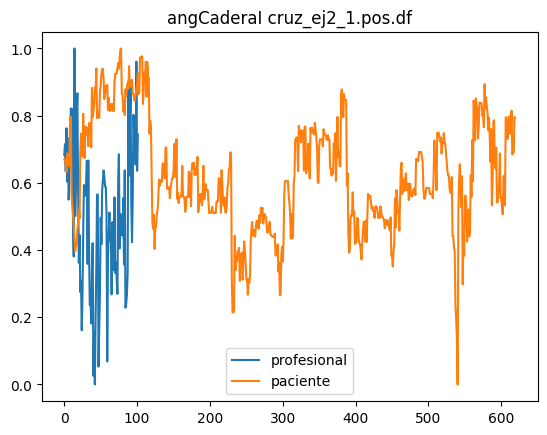

Numero de frames del profesional = 102
Numero de frames del paciente = 620


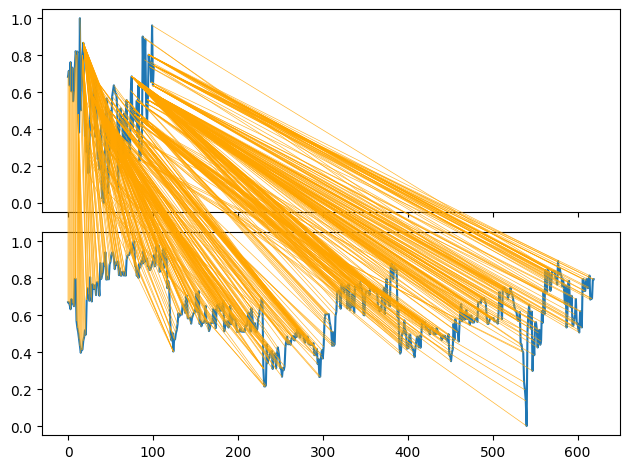

1.7957357892558066


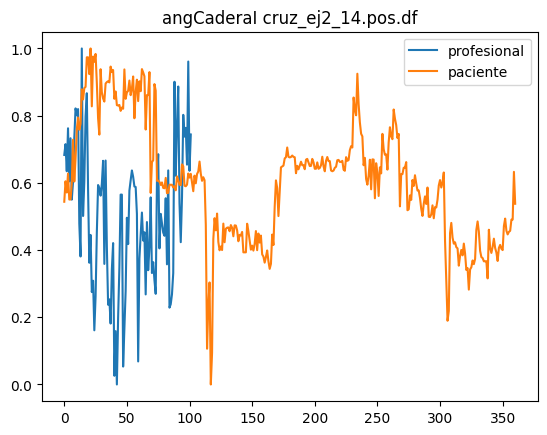

Numero de frames del profesional = 102
Numero de frames del paciente = 361


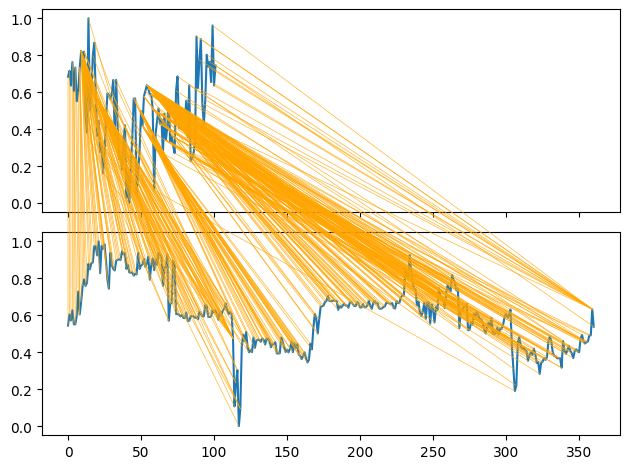

1.6981578068706025


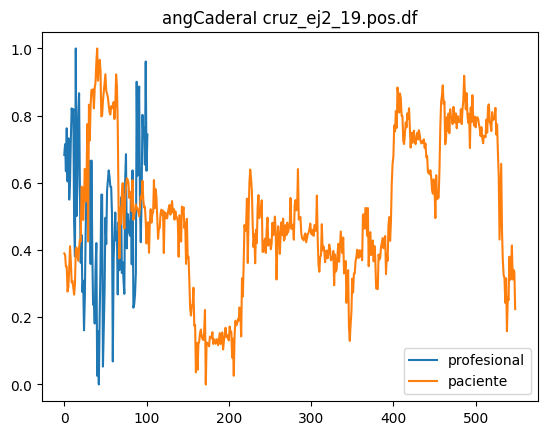

Numero de frames del profesional = 102
Numero de frames del paciente = 549


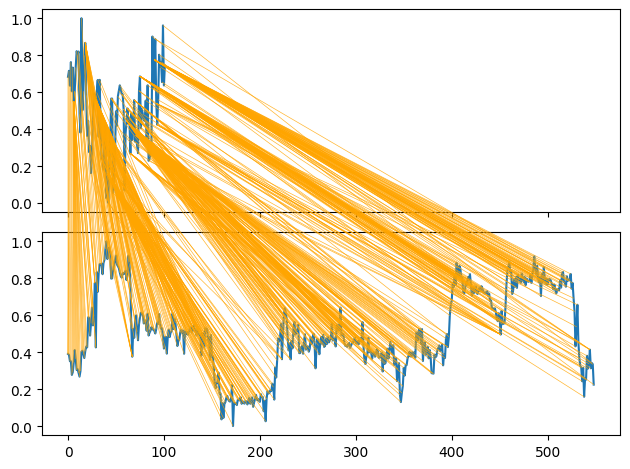

2.3265209764331383


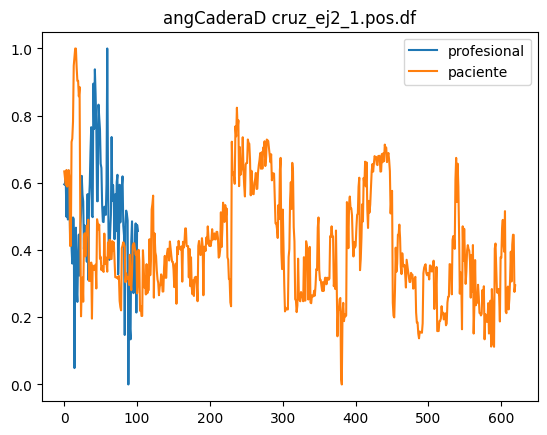

Numero de frames del profesional = 102
Numero de frames del paciente = 620


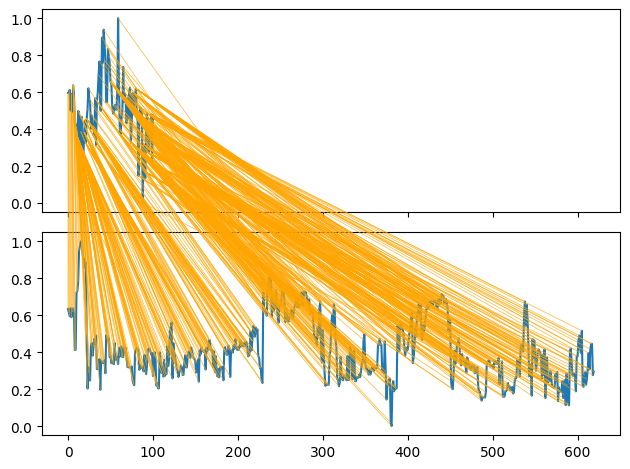

2.0841923227593893


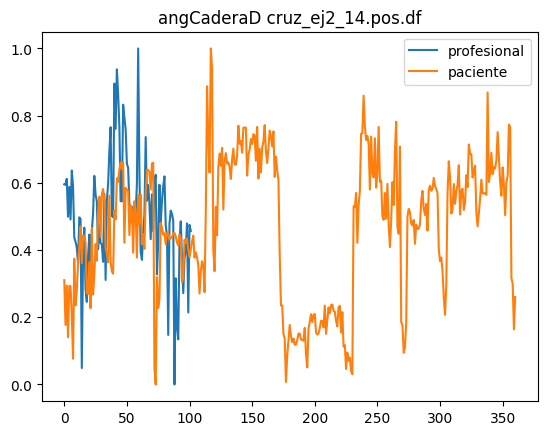

Numero de frames del profesional = 102
Numero de frames del paciente = 361


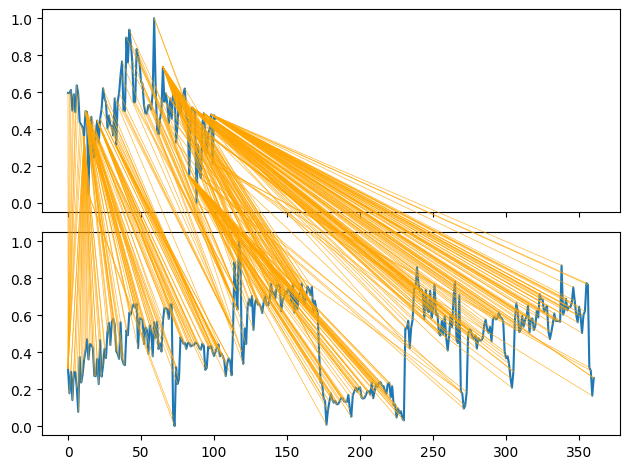

2.204350147222848


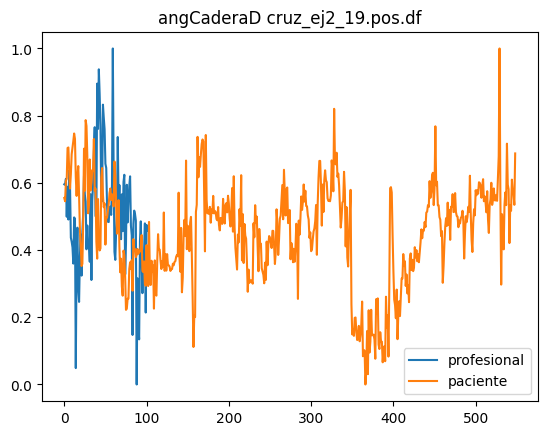

Numero de frames del profesional = 102
Numero de frames del paciente = 549


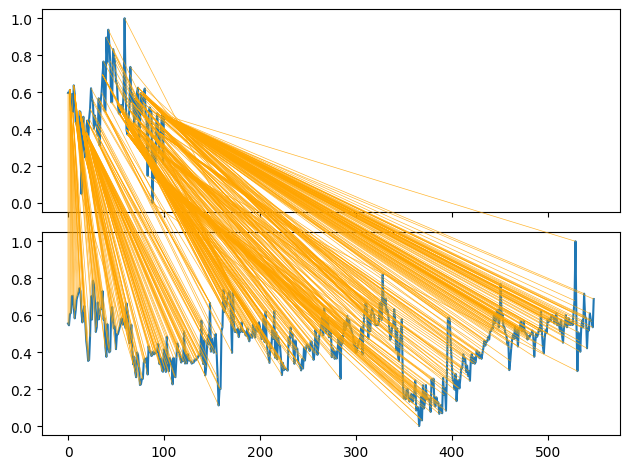

1.7910675000360612


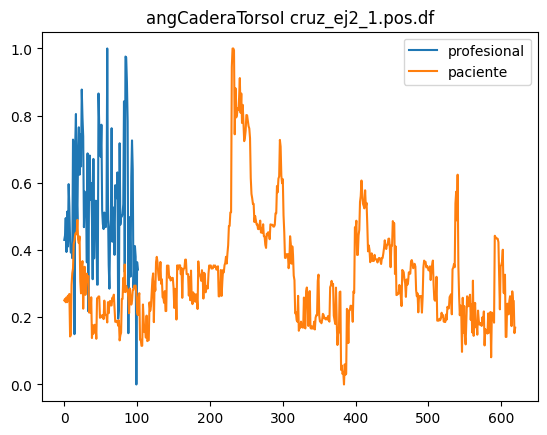

Numero de frames del profesional = 102
Numero de frames del paciente = 620


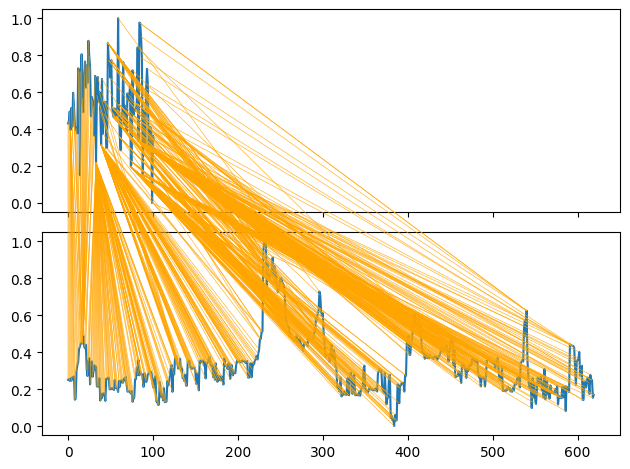

2.3102763315183714


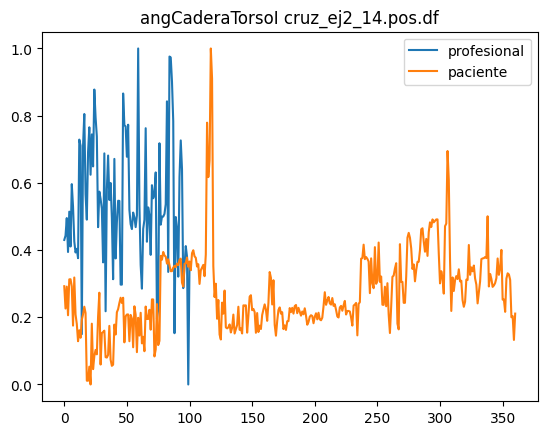

Numero de frames del profesional = 102
Numero de frames del paciente = 361


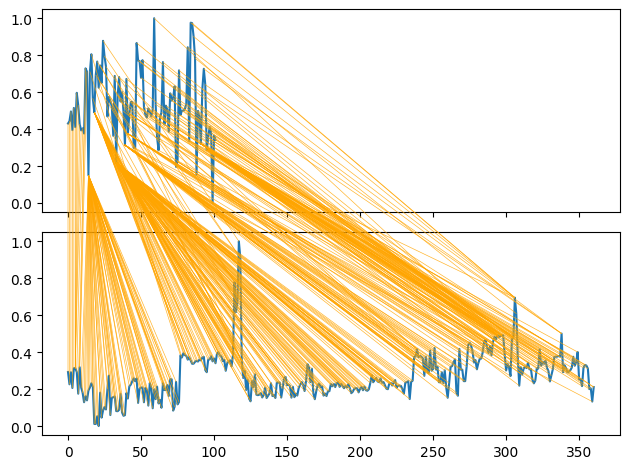

2.1852332321924477


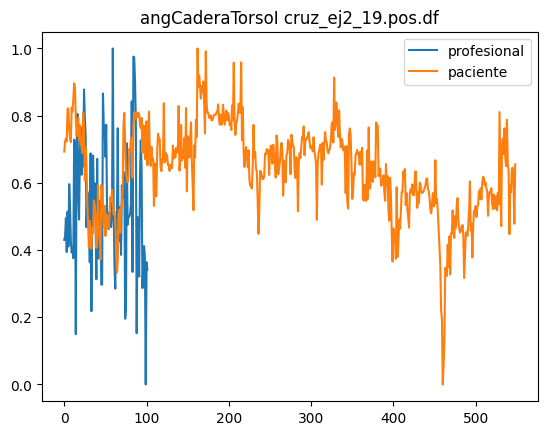

Numero de frames del profesional = 102
Numero de frames del paciente = 549


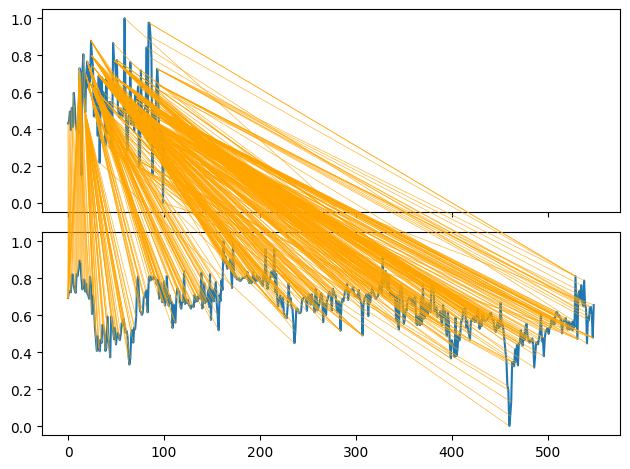

2.067942949482366


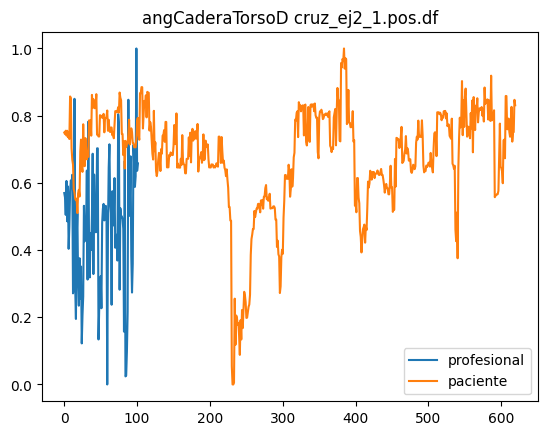

Numero de frames del profesional = 102
Numero de frames del paciente = 620


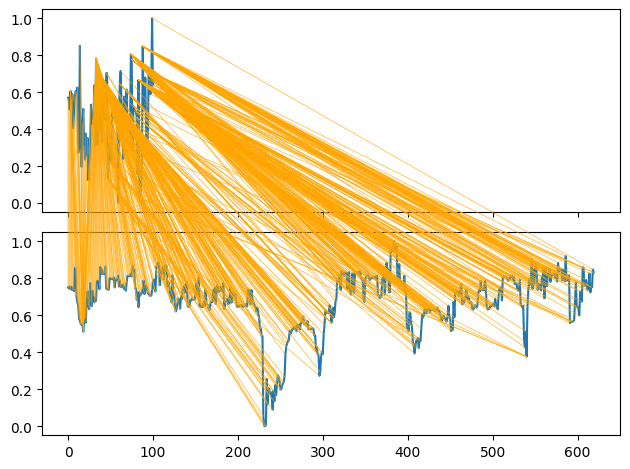

2.3102657079652875


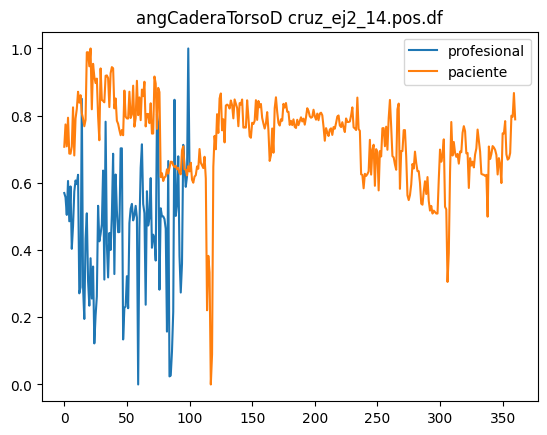

Numero de frames del profesional = 102
Numero de frames del paciente = 361


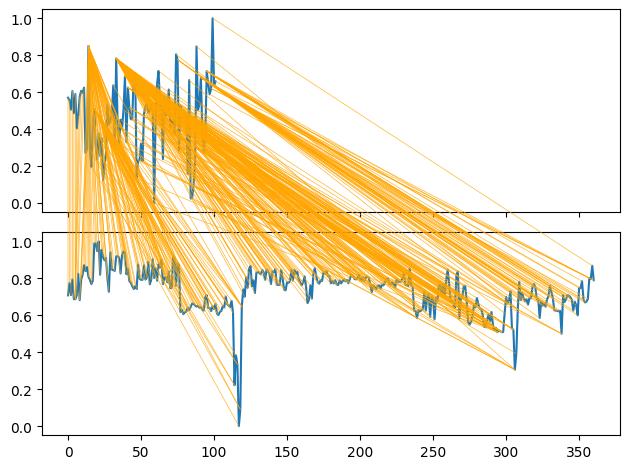

2.1852287493428117


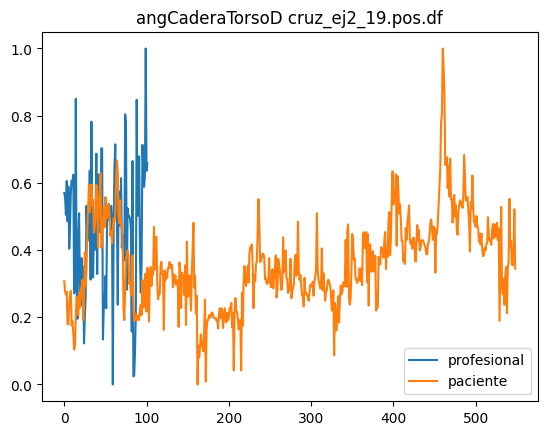

Numero de frames del profesional = 102
Numero de frames del paciente = 549


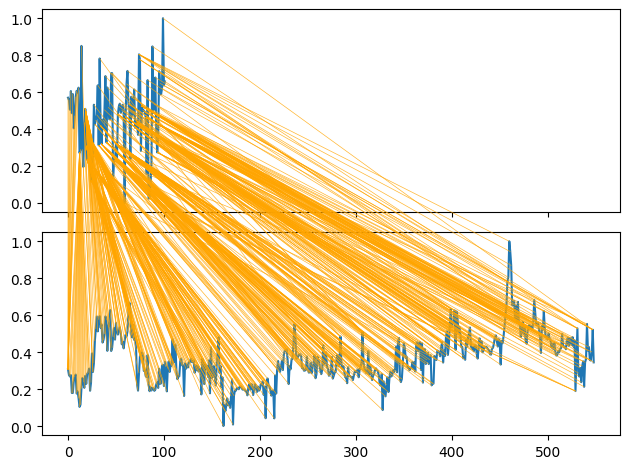

2.0679462181127173


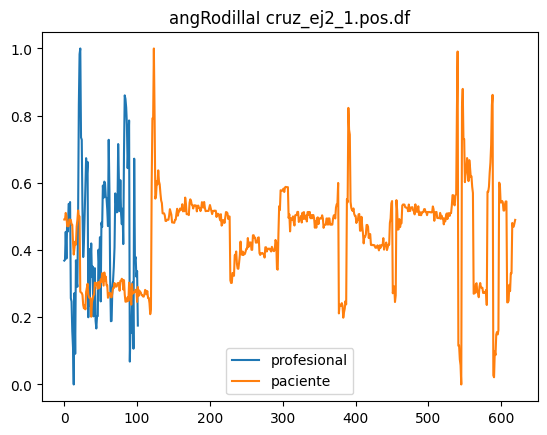

Numero de frames del profesional = 102
Numero de frames del paciente = 620


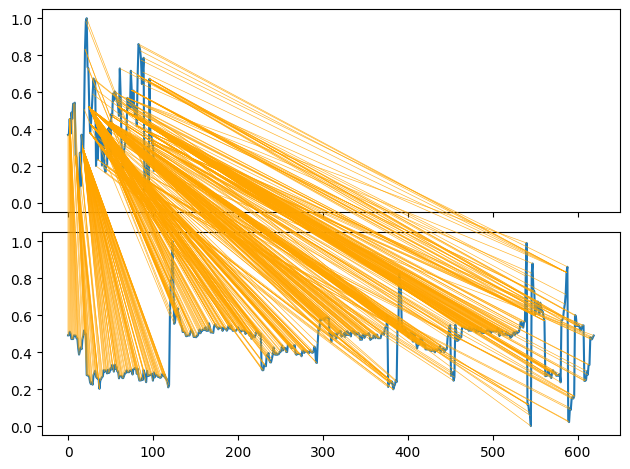

1.7020117147632603


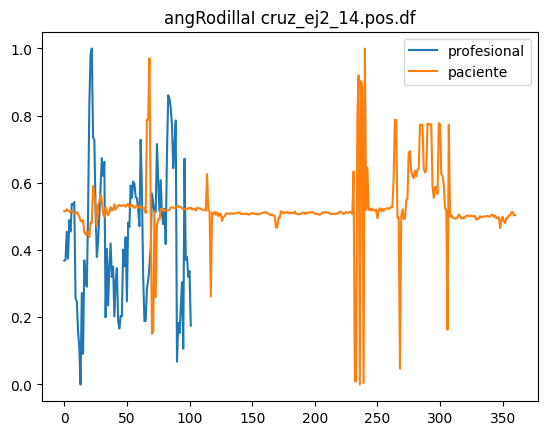

Numero de frames del profesional = 102
Numero de frames del paciente = 361


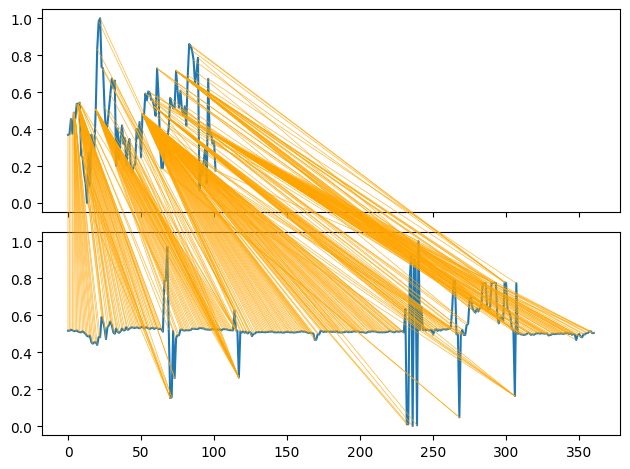

2.0372460275220914


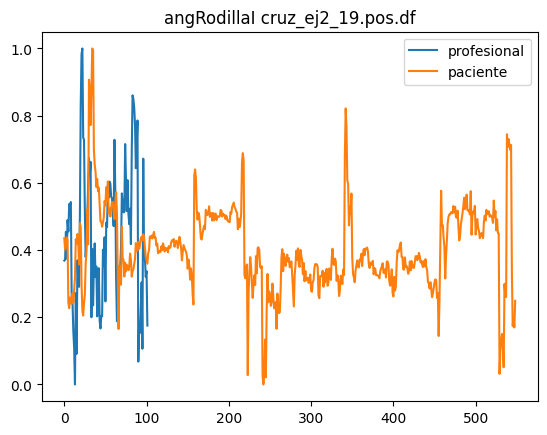

Numero de frames del profesional = 102
Numero de frames del paciente = 549


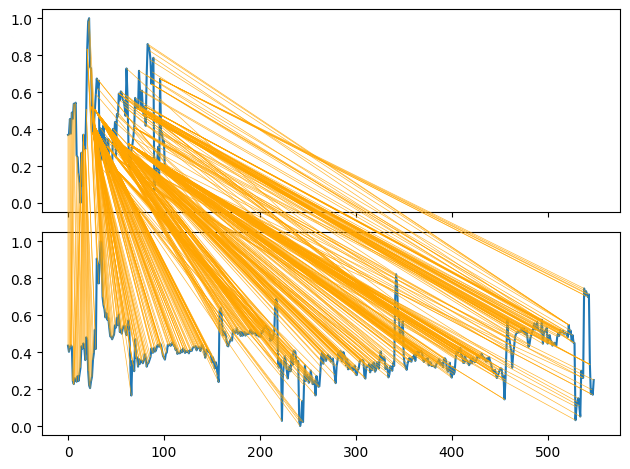

1.4738303644303286


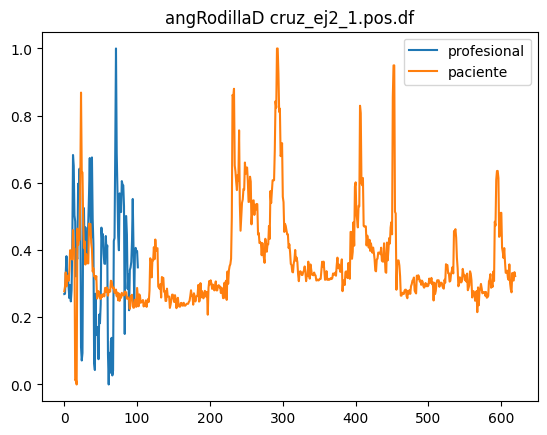

Numero de frames del profesional = 102
Numero de frames del paciente = 620


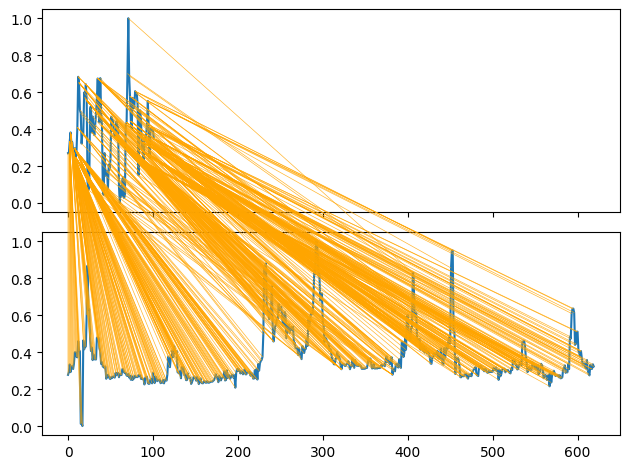

1.9189325776916242


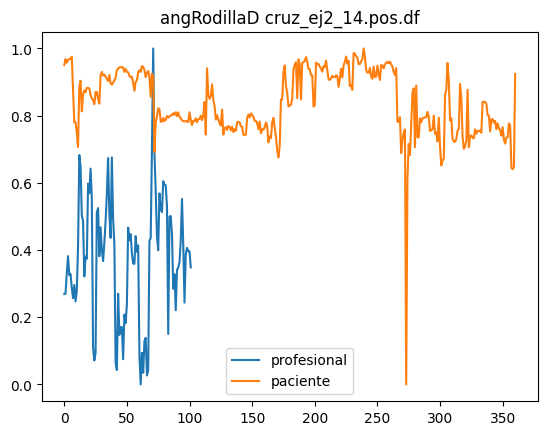

Numero de frames del profesional = 102
Numero de frames del paciente = 361


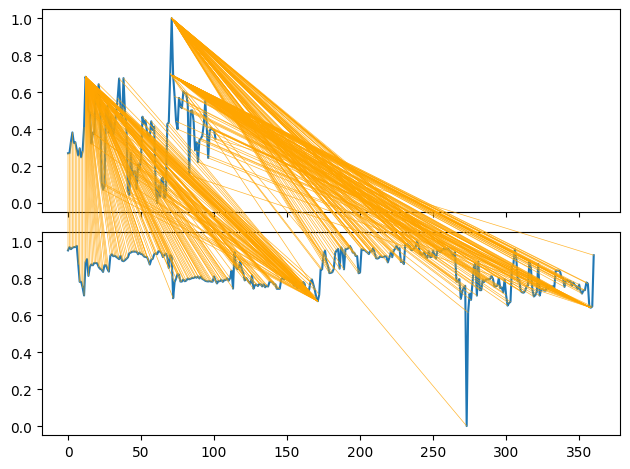

4.562005772088349


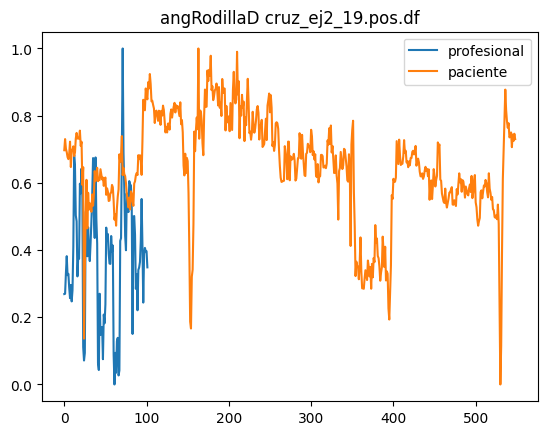

Numero de frames del profesional = 102
Numero de frames del paciente = 549


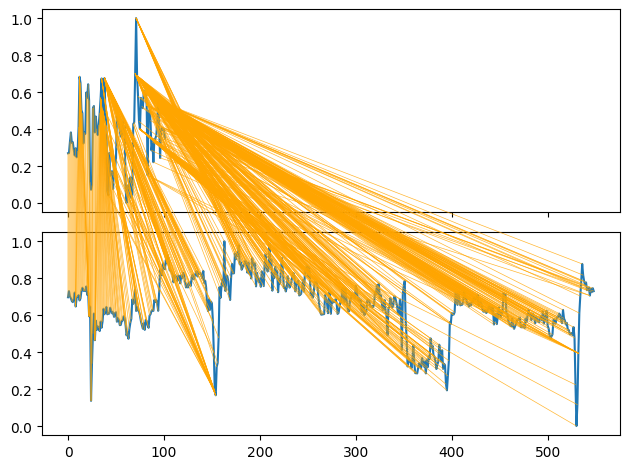

2.7905087098830976


In [101]:
for i in angles_cruz_ej2:
    profesional_ej = None
    for ej, profesional in cruz_ej2_profesionals.items():

        profesional_ej = profesional[i]
    
    for ej, patient in cruz_ej2_patients.items():
        plt.plot(profesional_ej, label="profesional")
        plt.plot(patient[i], label="paciente")
        plt.title(i + " " + ej)
        plt.legend()
        plt.show()
        print("Numero de frames del profesional =",len(profesional_ej))
        print("Numero de frames del paciente =",len(patient[i]))
        distance, paths = dtw.warping_paths_fast(np.asarray(profesional_ej), np.asarray(patient[i]))
        best_path = dtw.best_path(paths)
        dtwvis.plot_warping(profesional_ej, patient[i], best_path)
        plt.show()

        print(distance)


Cruz_ej3

In [102]:
angles_cruz_ej3 = [
    'angCaderaI', 
    'angCaderaD', 
    'angCaderaTorsoI', 
    'angCaderaTorsoD',
    'angRodillaI', 
    'angRodillaD'
    ]
saved_used_parts("cruz_ej3", angles_cruz_ej3)

In [103]:
dataframes_cruz_ej3_patients = get_filenames_patients("cruz_ej3")
dataframes_cruz_ej3_patients = dataframes_cruz_ej3_patients[:3]
cruz_ej3_patients = {}
for ej3 in dataframes_cruz_ej3_patients:
    temp = open_dataframe(ej3)
    temp = temp[angles_cruz_ej3]
    cruz_ej3_patients[ej3] = temp

dataframes_cruz_ej3_profesionals = get_filenames_profesionals("cruz_ej3")
cruz_ej3_profesionals = {}
for ej3 in dataframes_cruz_ej3_profesionals:
    temp = open_numpy(ej3)
    temp = temp[angles_cruz_ej3]
    cruz_ej3_profesionals[ej3] = temp


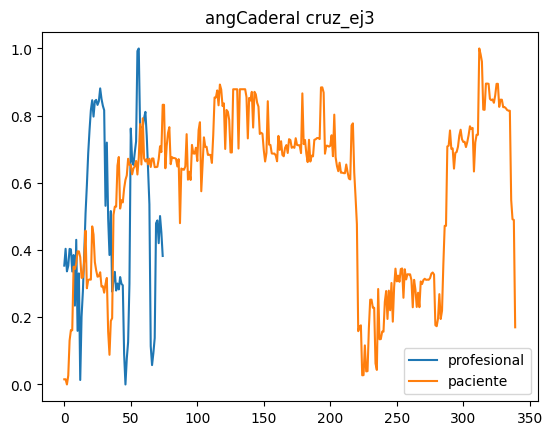

Numero de frames del profesional = 75
Numero de frames del paciente = 340


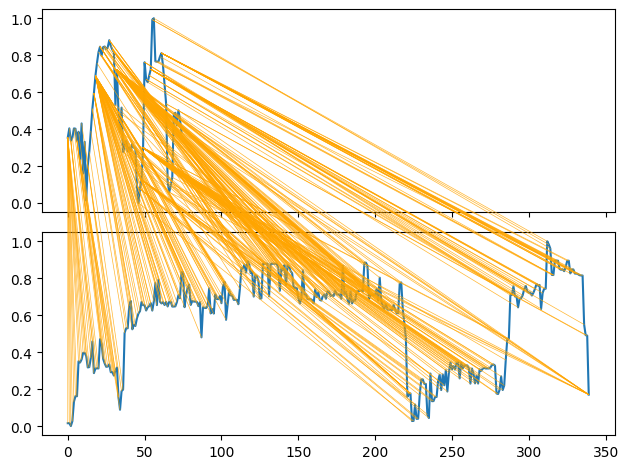

1.5361721005915585


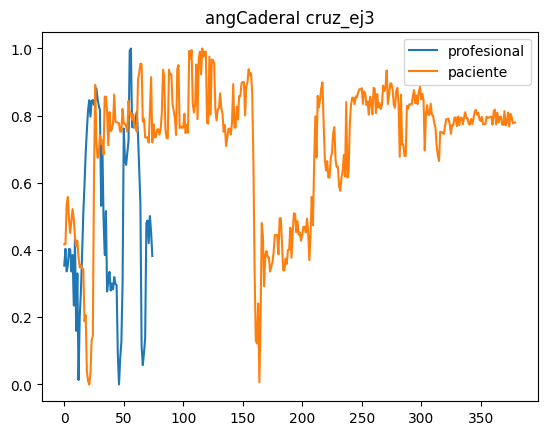

Numero de frames del profesional = 75
Numero de frames del paciente = 380


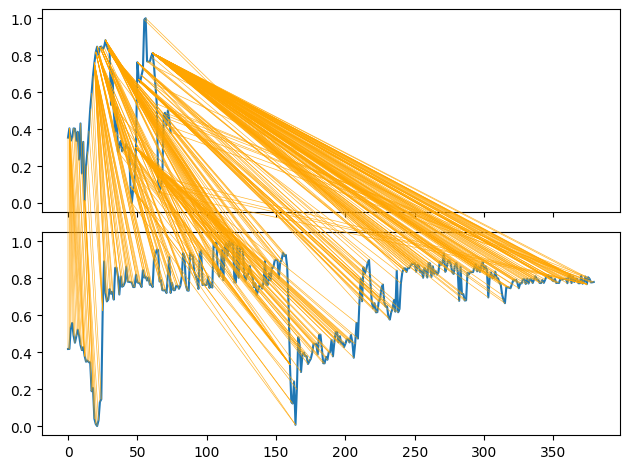

2.2110663897542597


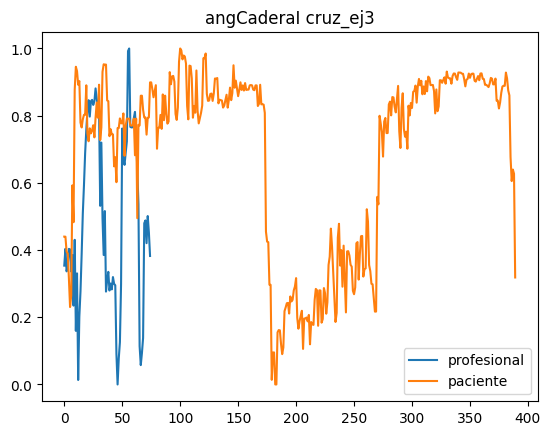

Numero de frames del profesional = 75
Numero de frames del paciente = 390


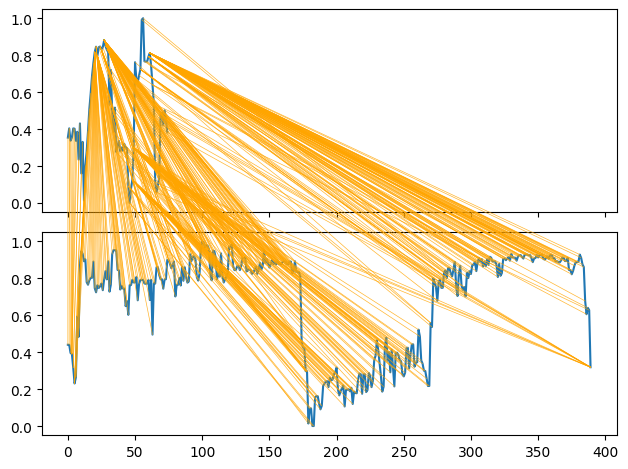

1.6728823246219908


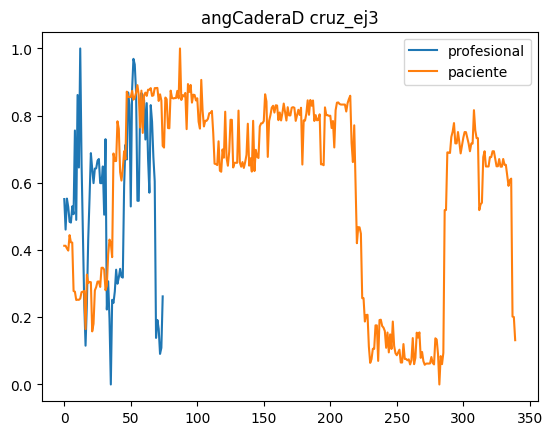

Numero de frames del profesional = 75
Numero de frames del paciente = 340


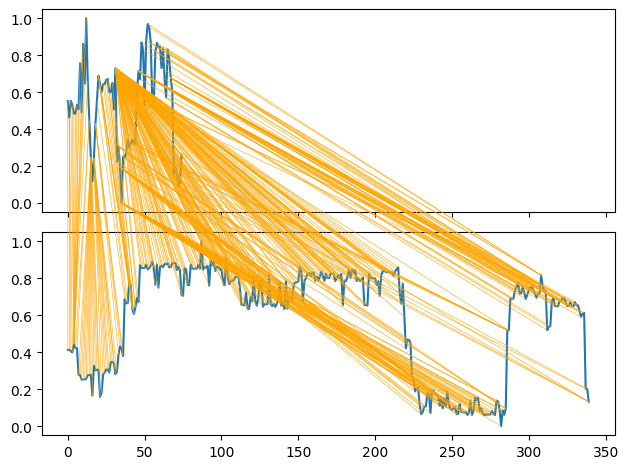

1.9260626367173195


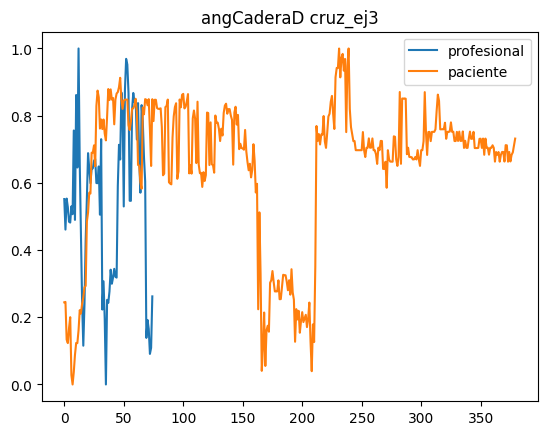

Numero de frames del profesional = 75
Numero de frames del paciente = 380


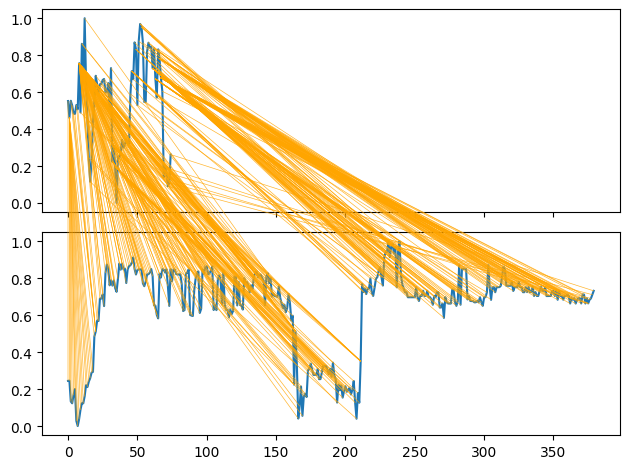

2.353064530595278


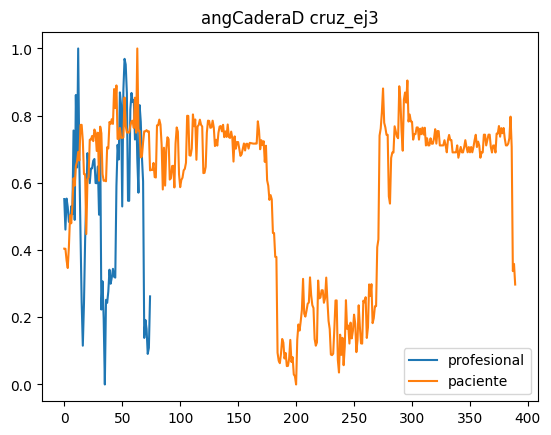

Numero de frames del profesional = 75
Numero de frames del paciente = 390


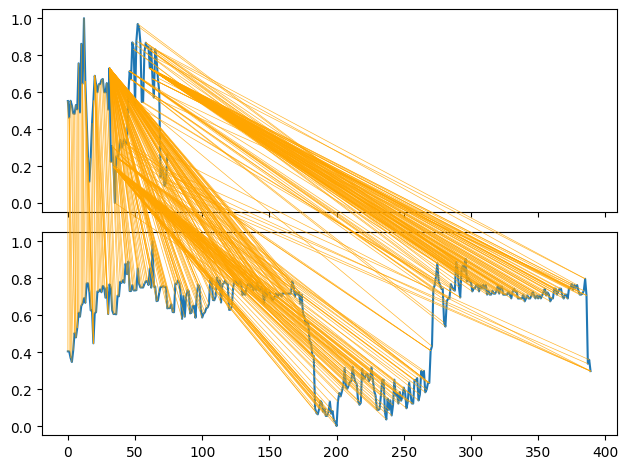

1.5461119653861228


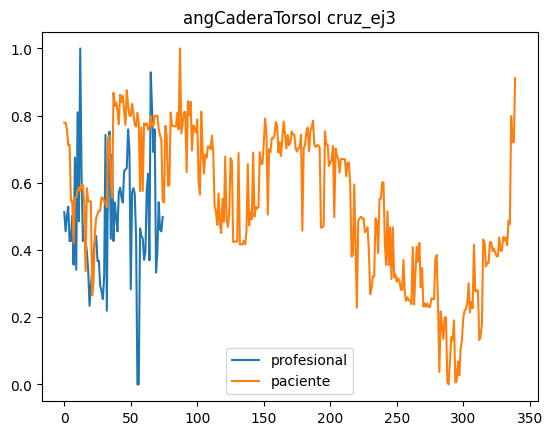

Numero de frames del profesional = 75
Numero de frames del paciente = 340


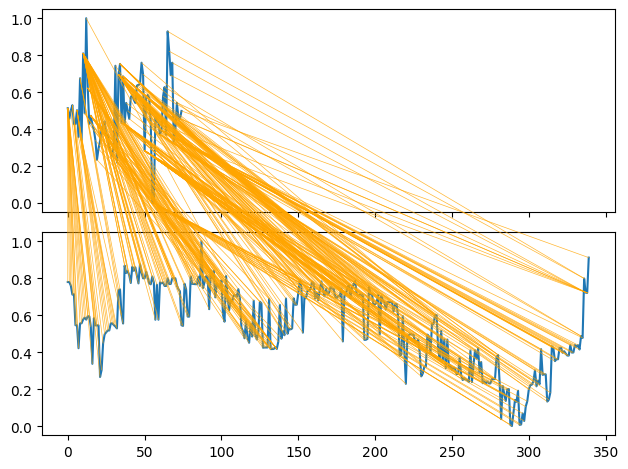

1.9895868014509994


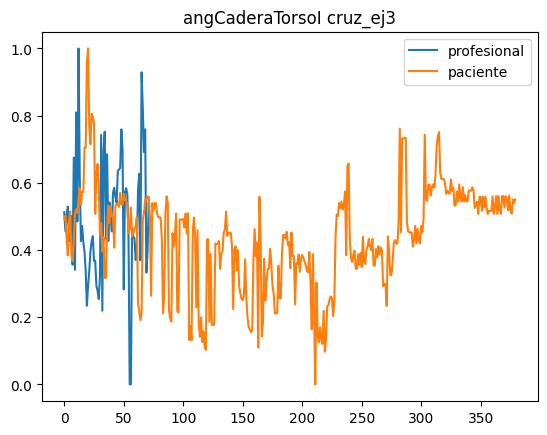

Numero de frames del profesional = 75
Numero de frames del paciente = 380


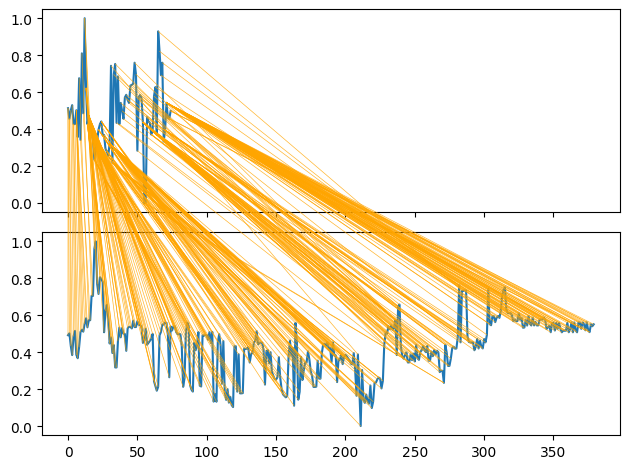

1.784196906030198


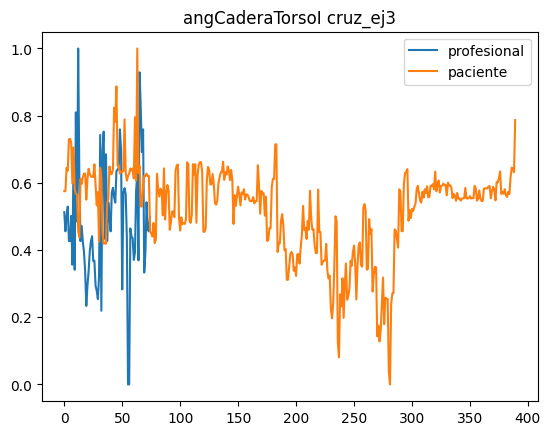

Numero de frames del profesional = 75
Numero de frames del paciente = 390


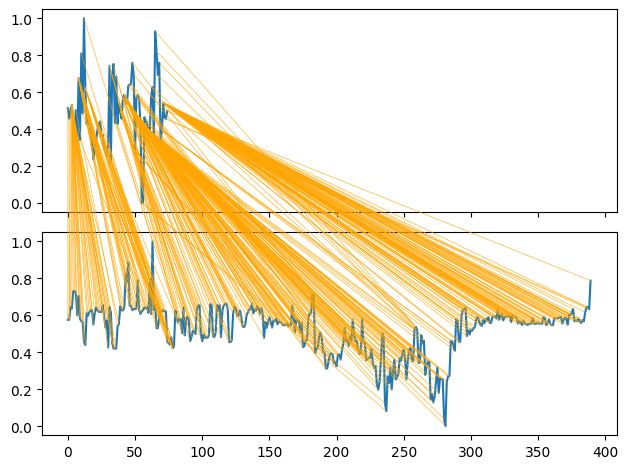

1.7534510955258615


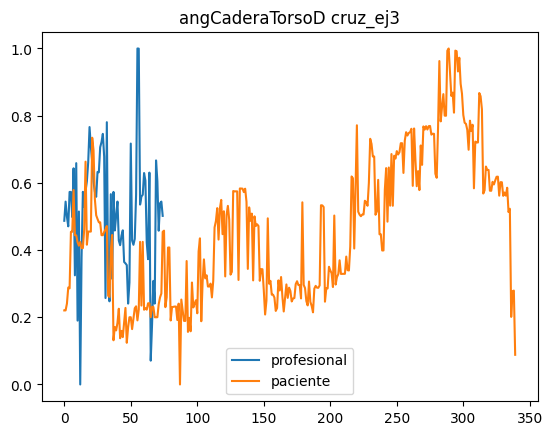

Numero de frames del profesional = 75
Numero de frames del paciente = 340


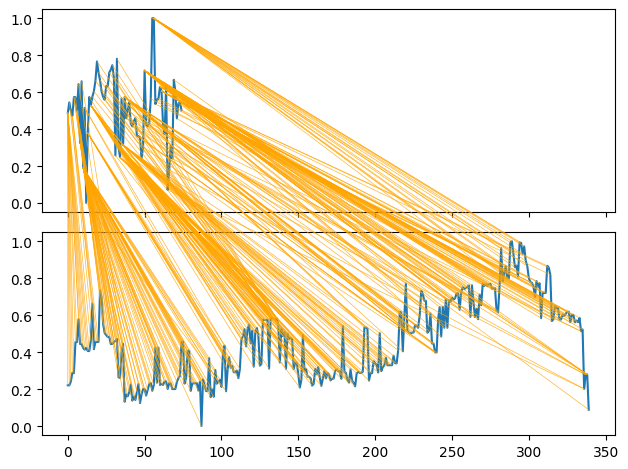

1.989578996730559


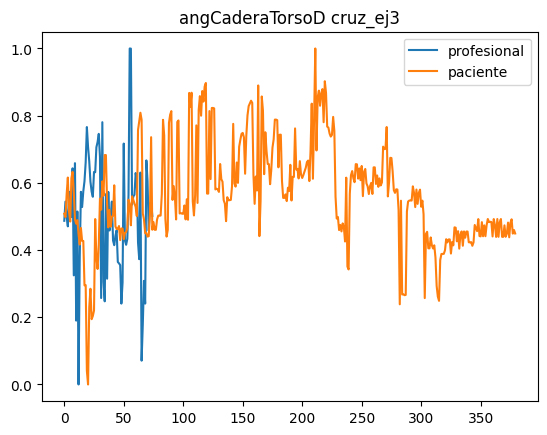

Numero de frames del profesional = 75
Numero de frames del paciente = 380


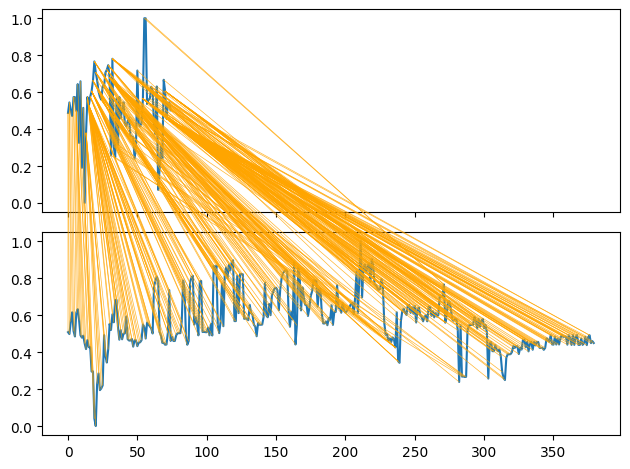

1.7841915726538786


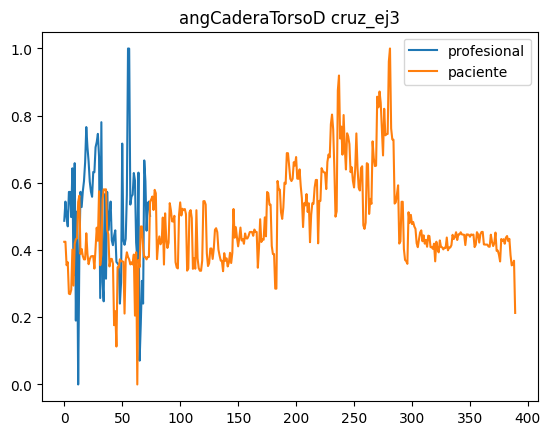

Numero de frames del profesional = 75
Numero de frames del paciente = 390


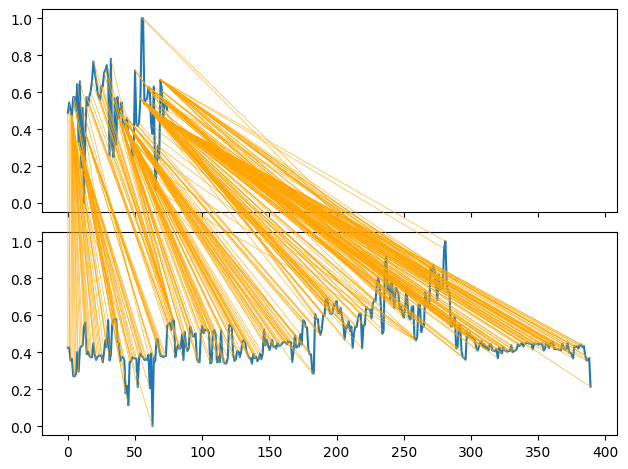

1.7534449382633732


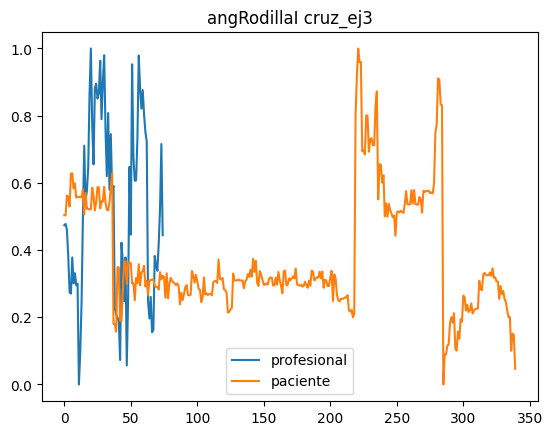

Numero de frames del profesional = 75
Numero de frames del paciente = 340


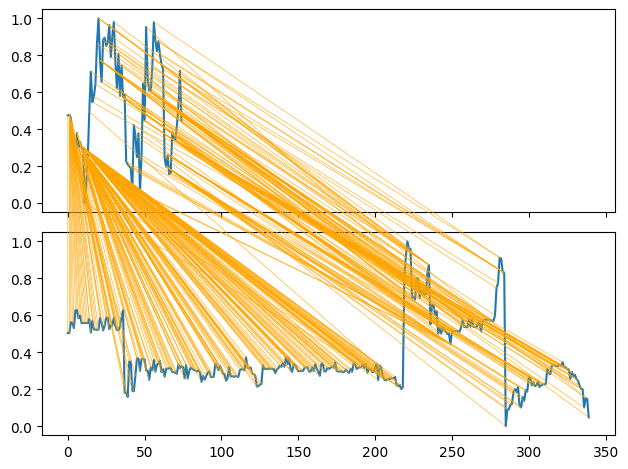

1.6746423157995705


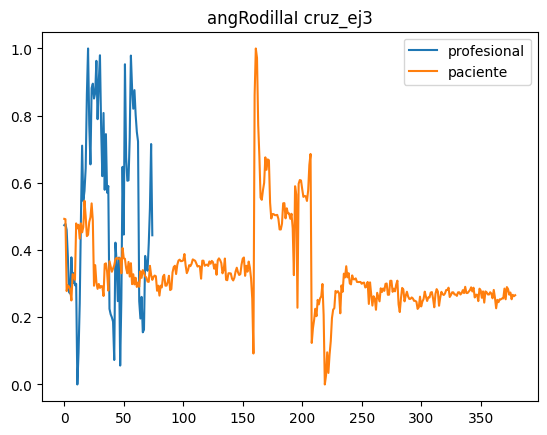

Numero de frames del profesional = 75
Numero de frames del paciente = 380


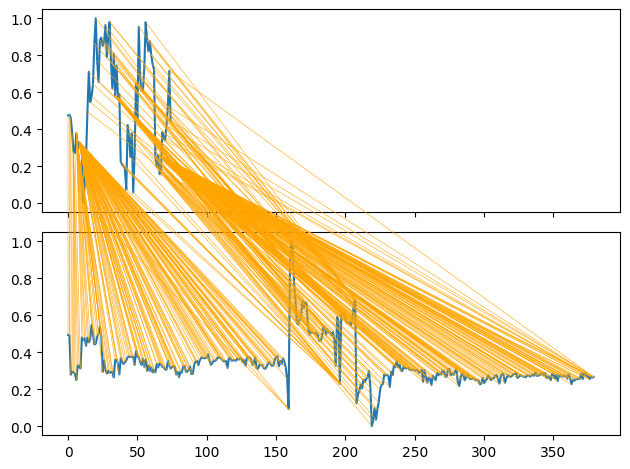

1.462580334949519


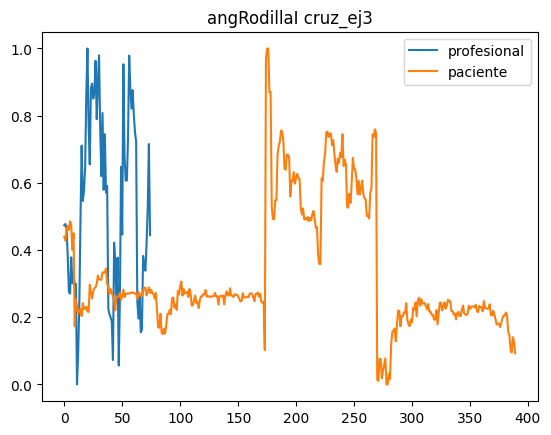

Numero de frames del profesional = 75
Numero de frames del paciente = 390


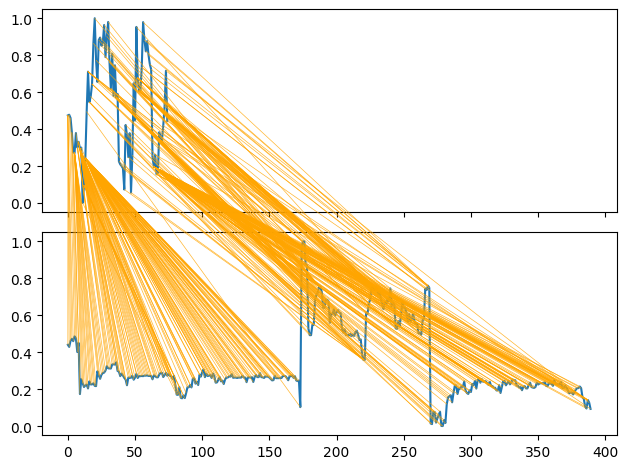

1.713962826044807


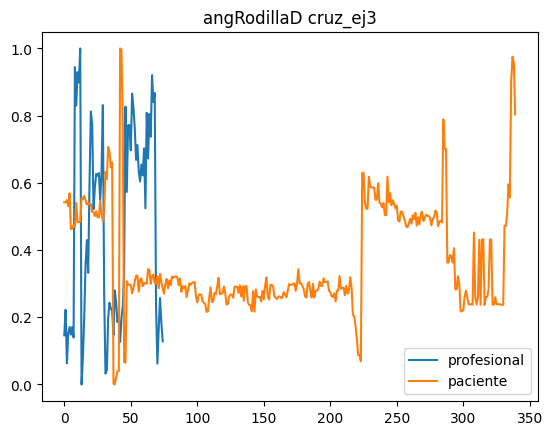

Numero de frames del profesional = 75
Numero de frames del paciente = 340


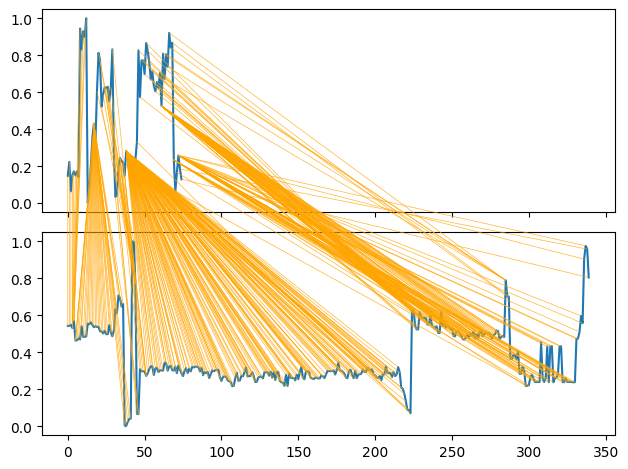

2.664674752269947


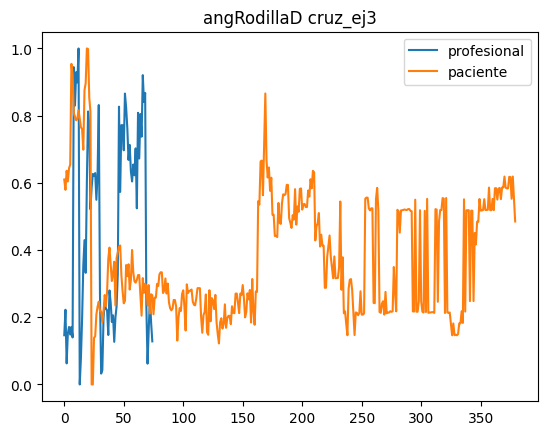

Numero de frames del profesional = 75
Numero de frames del paciente = 380


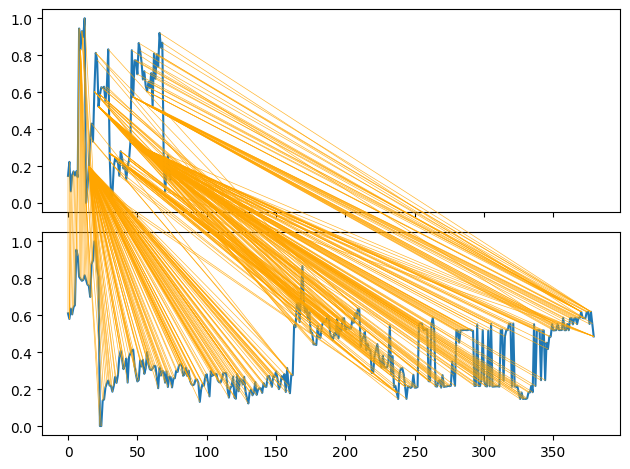

2.6631021022280086


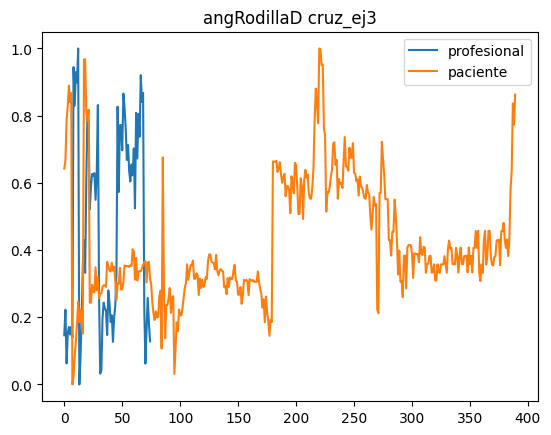

Numero de frames del profesional = 75
Numero de frames del paciente = 390


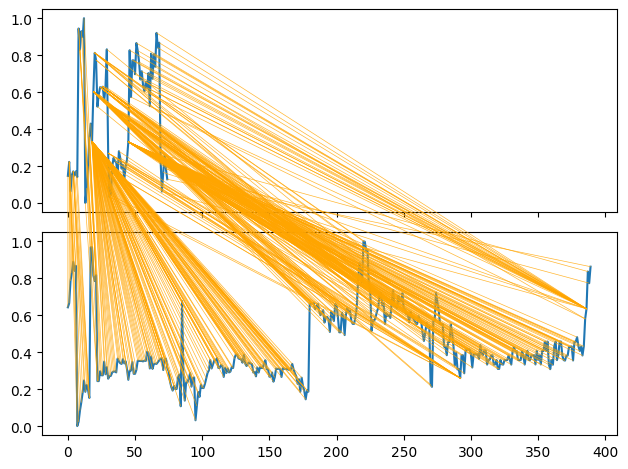

2.6886553417737056


In [104]:
for i in angles_cruz_ej3:
    profesional_ej = None
    for ej, profesional in cruz_ej3_profesionals.items():

        profesional_ej = profesional[i]
    
    for ej, patient in cruz_ej3_patients.items():
        plt.plot(profesional_ej, label="profesional")
        plt.plot(patient[i], label="paciente")
        plt.title(i + " " + "cruz_ej3")
        plt.legend()
        plt.show()
        print("Numero de frames del profesional =",len(profesional_ej))
        print("Numero de frames del paciente =",len(patient[i]))
        distance, paths = dtw.warping_paths_fast(np.asarray(profesional_ej), np.asarray(patient[i]))
        best_path = dtw.best_path(paths)
        dtwvis.plot_warping(profesional_ej, patient[i], best_path)
        plt.show()

        print(distance)

Cruz_ej4

In [105]:
angles_cruz_ej4 = [
    'angCaderaI', 
    'angCaderaD', 
    'angCaderaTorsoI', 
    'angCaderaTorsoD',
    'angRodillaI', 
    'angRodillaD'
    ]
saved_used_parts("cruz_ej4", angles_cruz_ej4)

In [106]:
dataframes_cruz_ej4_patients = get_filenames_patients("cruz_ej4")
dataframes_cruz_ej4_patients = dataframes_cruz_ej4_patients[5:6]
cruz_ej4_patients = {}
for ej4 in dataframes_cruz_ej4_patients:
    temp = open_dataframe(ej4)
    temp = temp[angles_cruz_ej4]
    cruz_ej4_patients[ej4] = temp

dataframes_cruz_ej4_profesionals = get_filenames_profesionals("cruz_ej4")
cruz_ej4_profesionals = {}
for ej4 in dataframes_cruz_ej4_profesionals:
    temp = open_numpy(ej4)
    temp = temp[angles_cruz_ej4]
    cruz_ej4_profesionals[ej4] = temp

In [107]:
for i in angles_cruz_ej4:
    profesional_ej = None
    for ej, profesional in cruz_ej4_profesionals.items():

        profesional_ej = profesional[i]
    
    for ej, patient in cruz_ej4_patients.items():
        """plt.plot(profesional_ej, label="profesional")
        plt.plot(patient[i], label="paciente")
        plt.title(i + " " + ej)
        plt.legend()
        plt.show()"""
        print("Numero de frames del profesional =",len(profesional_ej))
        print("Numero de frames del paciente =",len(patient[i]))
        distance, paths = dtw.warping_paths_fast(np.asarray(profesional_ej), np.asarray(patient[i]))
        best_path = dtw.best_path(paths)
        #dtwvis.plot_warping(profesional_ej, patient[i], best_path)
        #plt.show()

        print("Distancia", i, ej, distance)

Numero de frames del profesional = 79
Numero de frames del paciente = 194
Distancia angCaderaI cruz_ej4_42.pos.df 1.6297933413215286
Numero de frames del profesional = 79
Numero de frames del paciente = 194
Distancia angCaderaD cruz_ej4_42.pos.df 1.778896761695491
Numero de frames del profesional = 79
Numero de frames del paciente = 194
Distancia angCaderaTorsoI cruz_ej4_42.pos.df 2.134573927925827
Numero de frames del profesional = 79
Numero de frames del paciente = 194
Distancia angCaderaTorsoD cruz_ej4_42.pos.df 2.1345685056420827
Numero de frames del profesional = 79
Numero de frames del paciente = 194
Distancia angRodillaI cruz_ej4_42.pos.df 1.4245526462859053
Numero de frames del profesional = 79
Numero de frames del paciente = 194
Distancia angRodillaD cruz_ej4_42.pos.df 2.2382593306356537


Pelota 1

In [108]:
angles_pelota1 = [
    'angCodoI', 
    'angCodoD', 
    'angHombroI', 
    'angHombroD'
    ]
saved_used_parts("pelota1", angles_pelota1)

In [109]:
dataframes_pelota1_patients = get_filenames_patients("pelota1")
dataframes_pelota1_patients = dataframes_pelota1_patients[:3]
pelota1_patients = {}
for ej1 in dataframes_pelota1_patients:
    temp = open_dataframe(ej1)
    temp = temp[angles_pelota1]
    pelota1_patients[ej1] = temp

dataframes_pelota1_profesionals = get_filenames_profesionals("pelota1")
pelota1_profesionals = {}
for ej1 in dataframes_pelota1_profesionals:
    temp = open_numpy(ej1)
    temp = temp[angles_pelota1]
    pelota1_profesionals[ej1] = temp

angCodoI


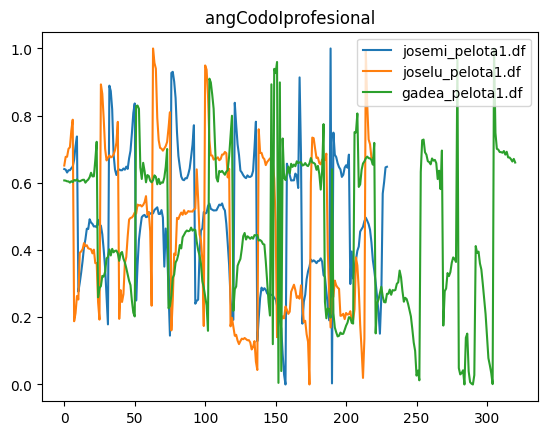

angCodoD


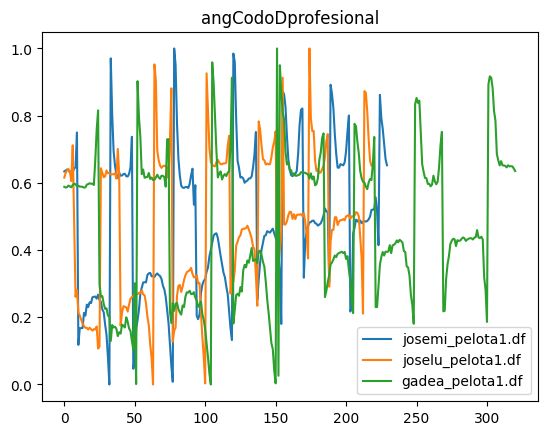

angHombroI


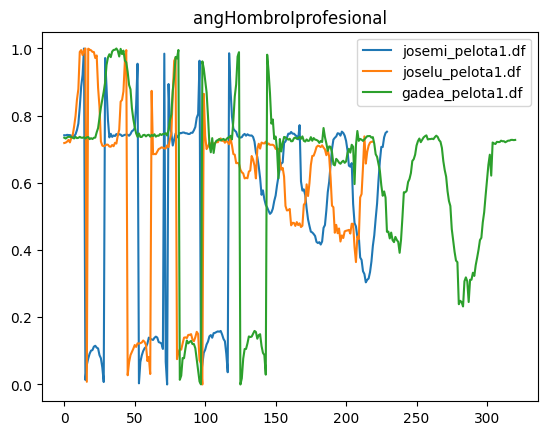

angHombroD


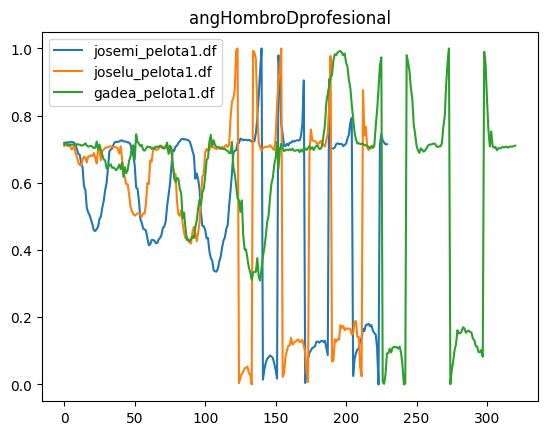

In [110]:
for i in angles_pelota1:
    #print(cruz_ej2_profesionals.items())
    print(i)
    profesional_ej = None
    for ej, profesional in pelota1_profesionals.items():
        profesional_ej = profesional[i]
    
        plt.plot(profesional_ej, label=ej)
    plt.title(i + "profesional")
    plt.legend()
    plt.show()

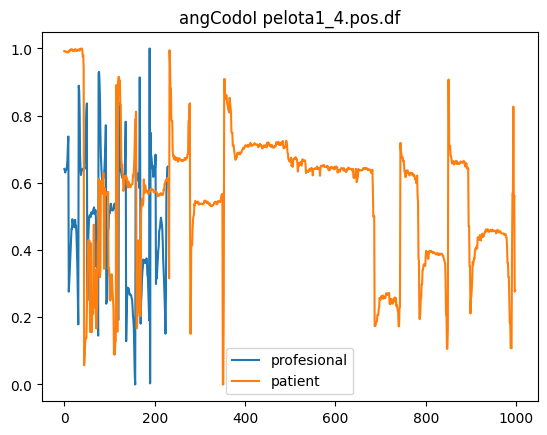

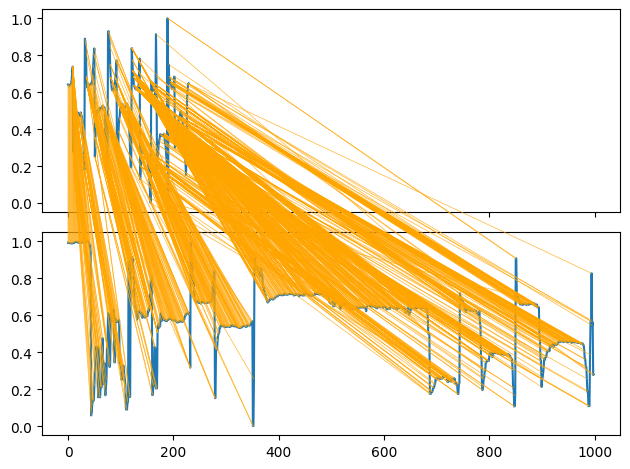

2.654562159285408


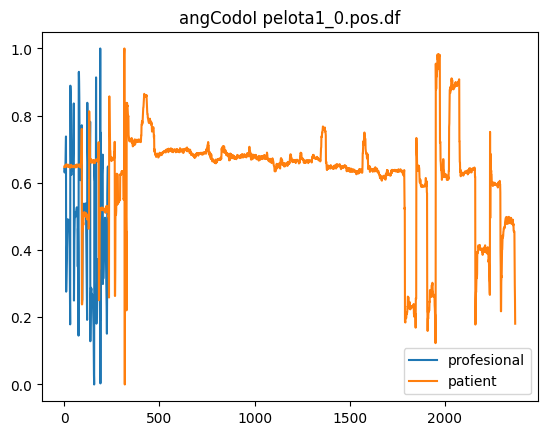

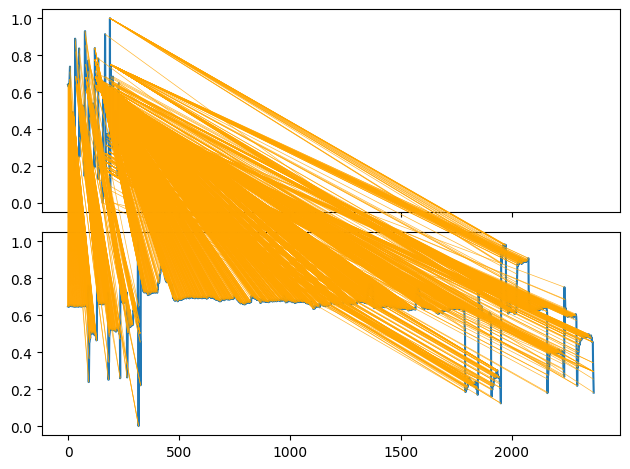

2.5207369226329437


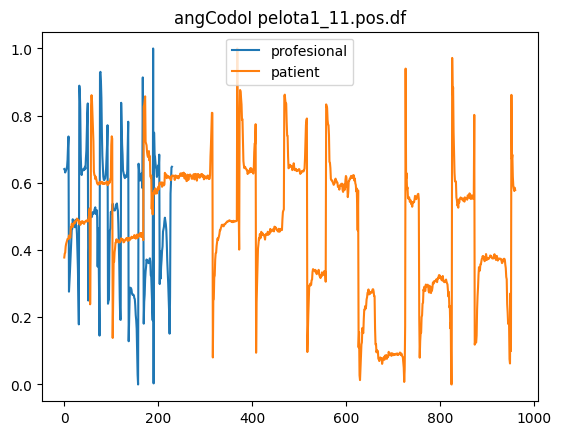

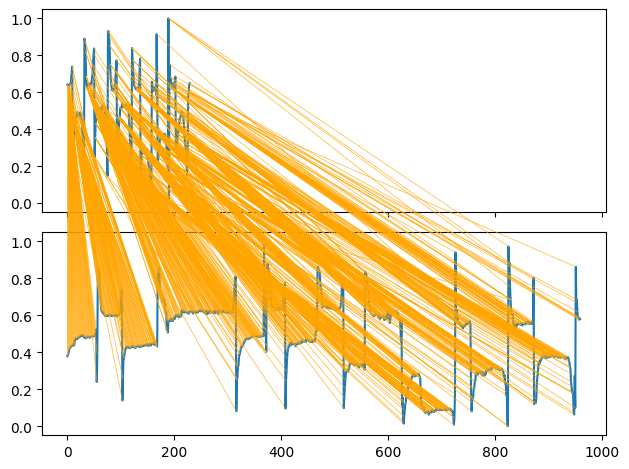

2.410499634271438


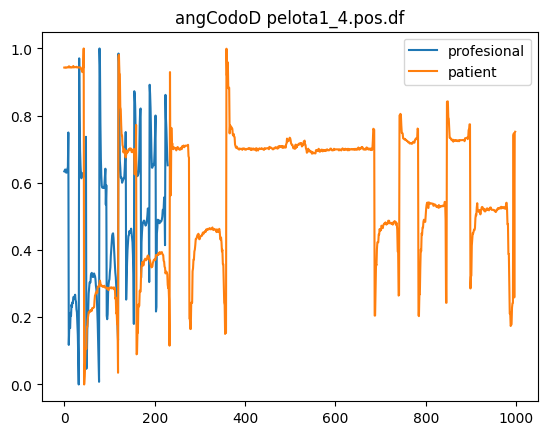

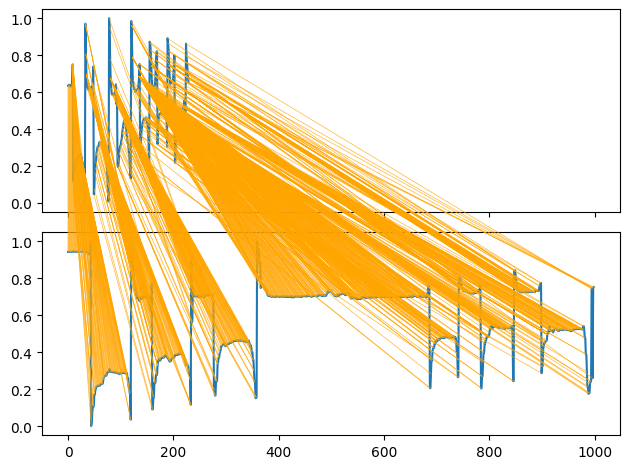

1.8971053646918181


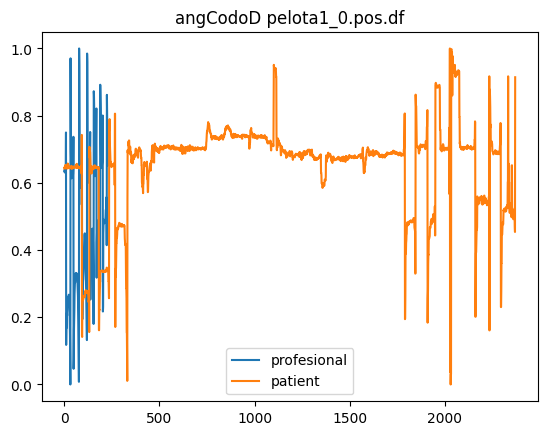

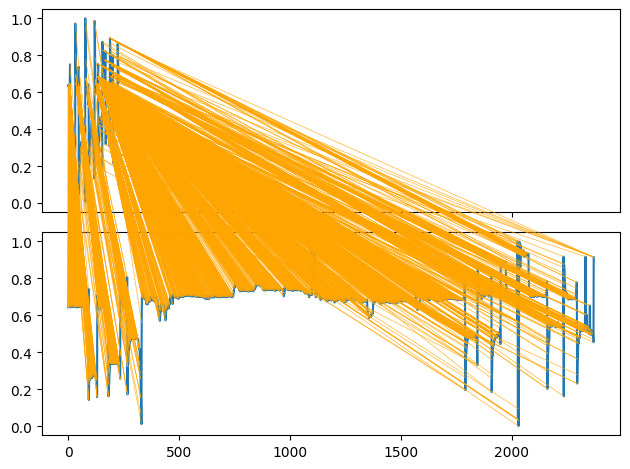

2.9577866868265197


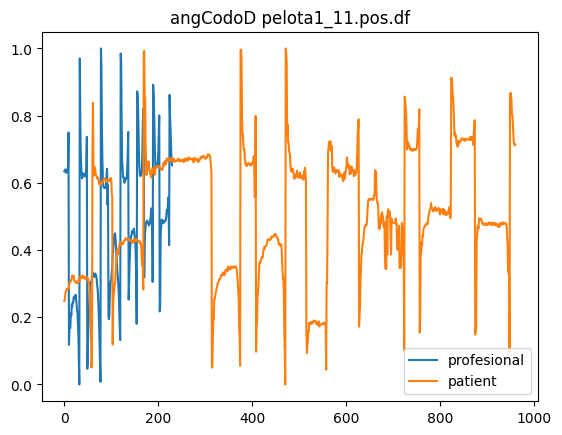

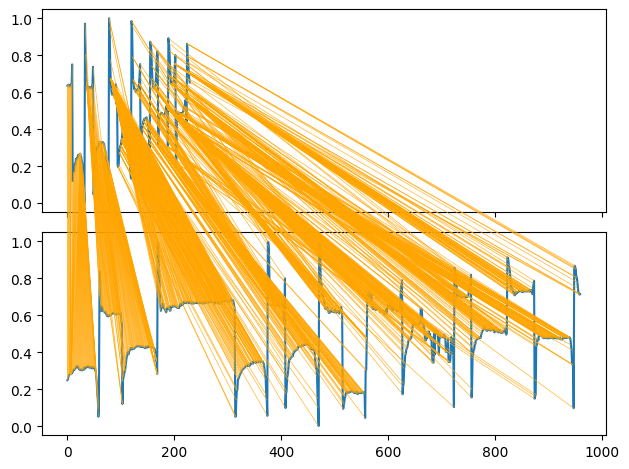

2.8328917147893207


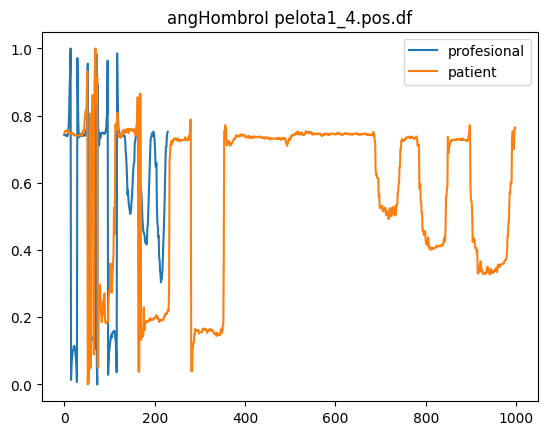

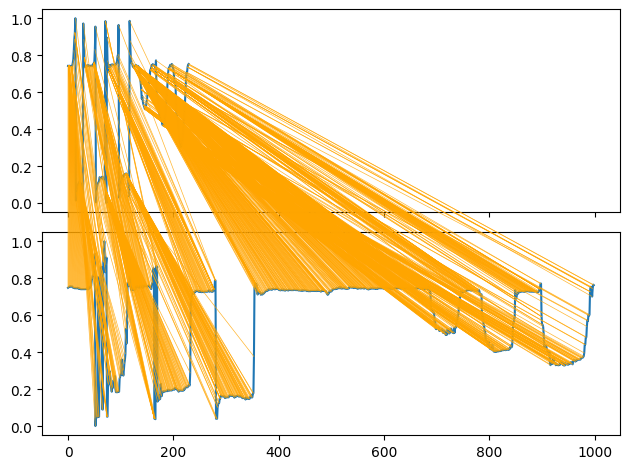

2.7203721116109865


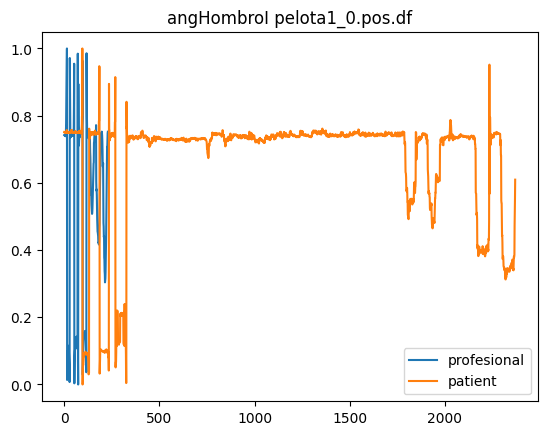

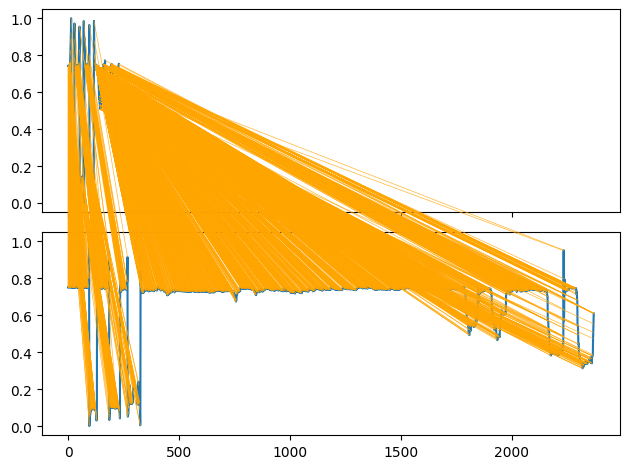

1.554021998802375


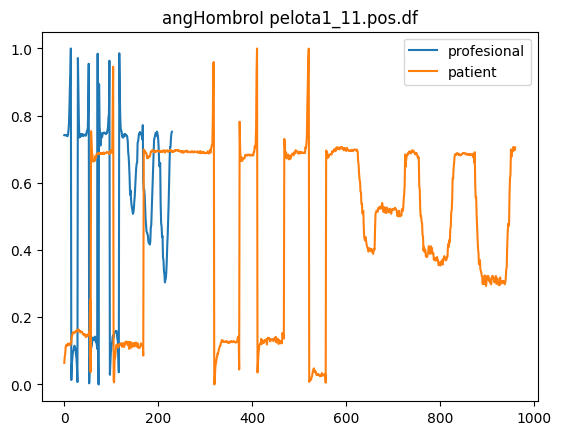

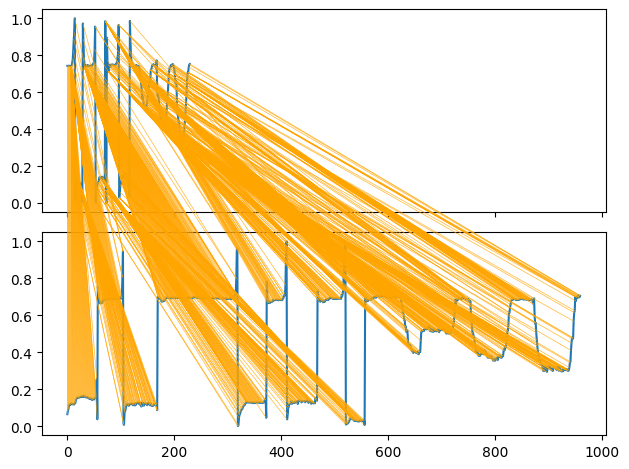

5.02397099173365


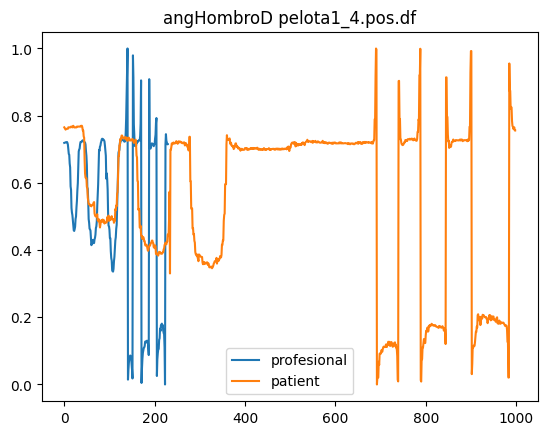

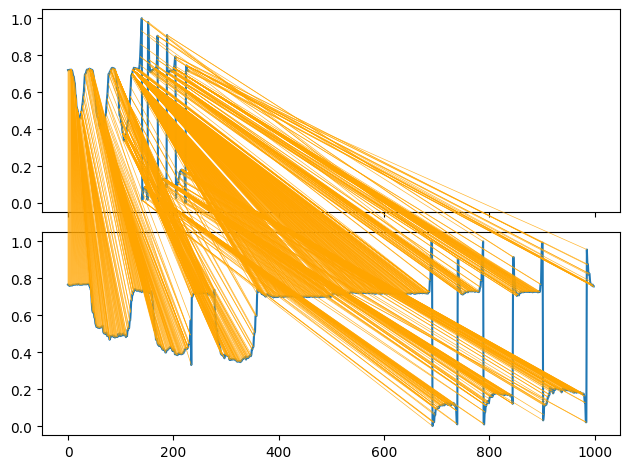

0.7744324522622936


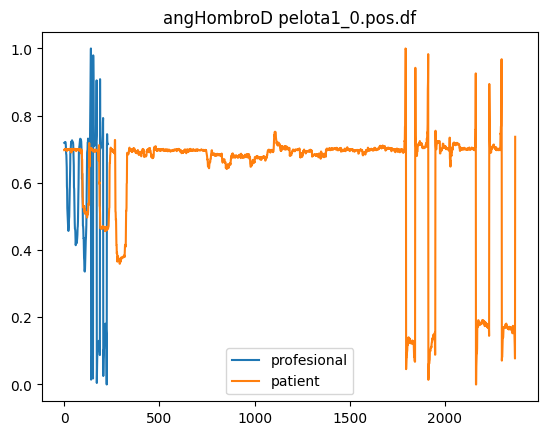

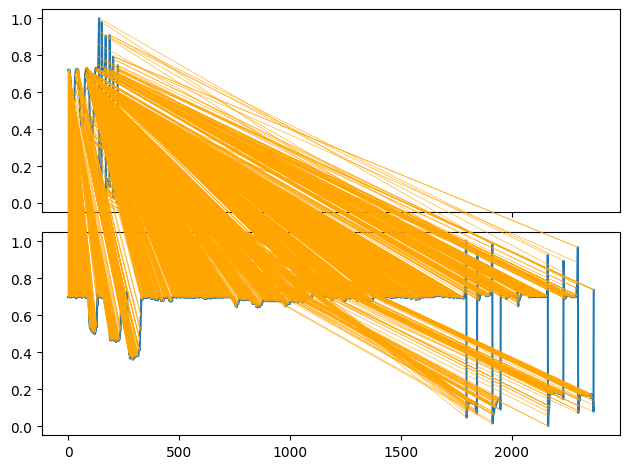

2.385404745192361


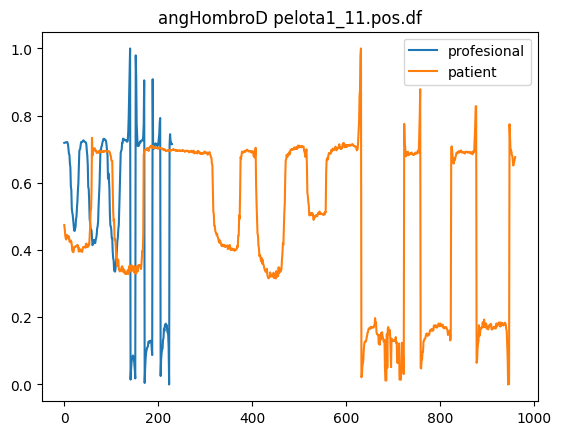

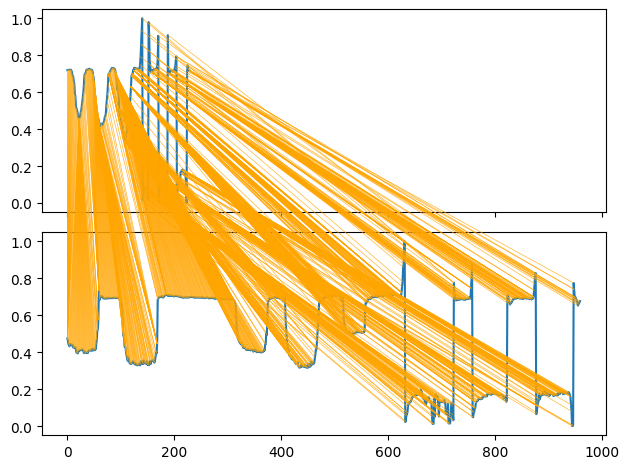

2.032976140830998


In [111]:
for i in angles_pelota1:
    profesional_ej = None
    ej, profesional = next(iter(pelota1_profesionals.items()))
    profesional_ej = profesional[i]
    
    for ej, patient in pelota1_patients.items():
        plt.plot(profesional_ej, label="profesional")
        plt.plot(patient[i], label="patient")
        plt.title(i + " " + ej)
        plt.legend()
        plt.show()

        distance, paths = dtw.warping_paths_fast(np.asarray(profesional_ej), np.asarray(patient[i]))
        best_path = dtw.best_path(paths)
        dtwvis.plot_warping(profesional_ej, patient[i], best_path)
        plt.show()

        print(distance)

Pelota 2

In [112]:
angles_pelota2 = [
    'angCodoI', 
    'angCodoD', 
    'angHombroI', 
    'angHombroD'
    ]
saved_used_parts("pelota2", angles_pelota2)

In [113]:
dataframes_pelota2_patients = get_filenames_patients("pelota2")
dataframes_pelota2_patients = dataframes_pelota2_patients[:3]
pelota2_patients = {}
for ej2 in dataframes_pelota2_patients:
    temp = open_dataframe(ej2)
    temp = temp[angles_pelota2]
    pelota2_patients[ej2] = temp

dataframes_pelota2_profesionals = get_filenames_profesionals("pelota2")
pelota2_profesionals = {}
for ej2 in dataframes_pelota2_profesionals:
    temp = open_numpy(ej2)
    temp = temp[angles_pelota2]
    pelota2_profesionals[ej2] = temp

angCodoI


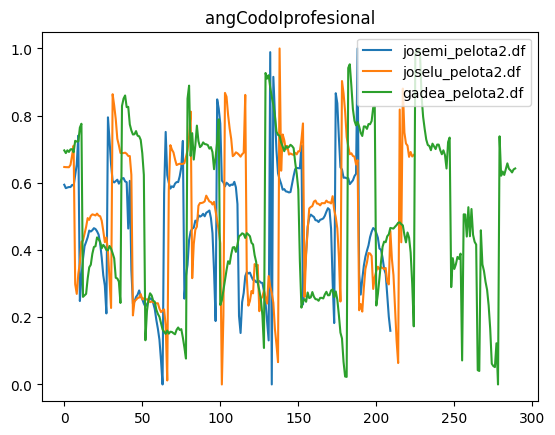

angCodoD


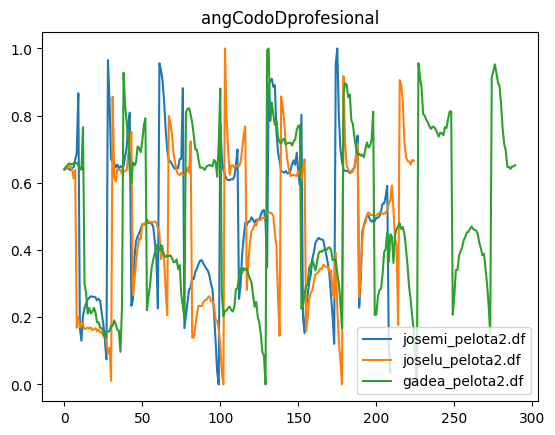

angHombroI


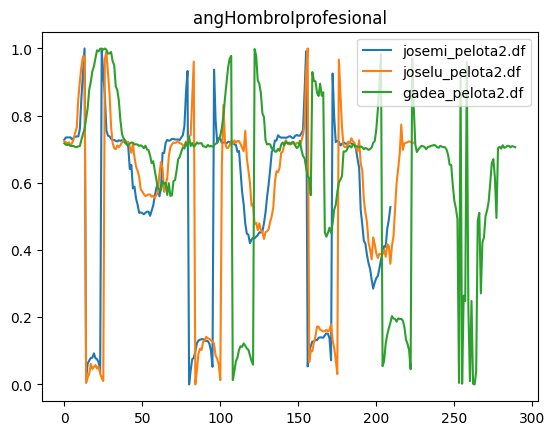

angHombroD


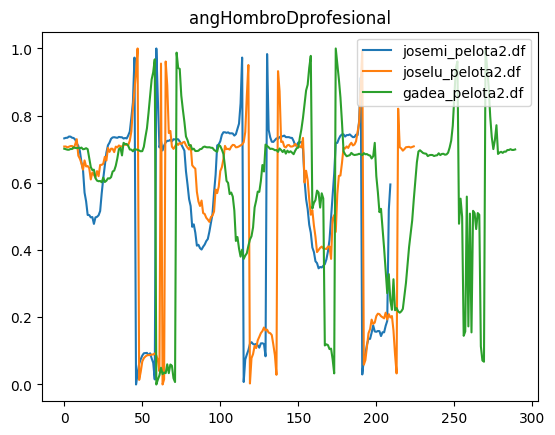

In [114]:
for i in angles_pelota2:
    #print(cruz_ej2_profesionals.items())
    print(i)
    profesional_ej = None
    for ej, profesional in pelota2_profesionals.items():
        profesional_ej = profesional[i]
    
        plt.plot(profesional_ej, label=ej)
    plt.title(i + "profesional")
    plt.legend()
    plt.show()

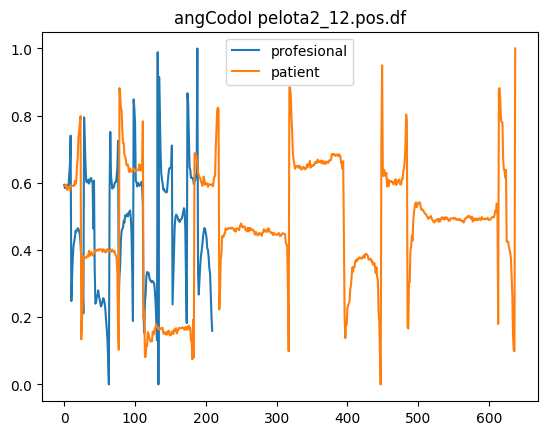

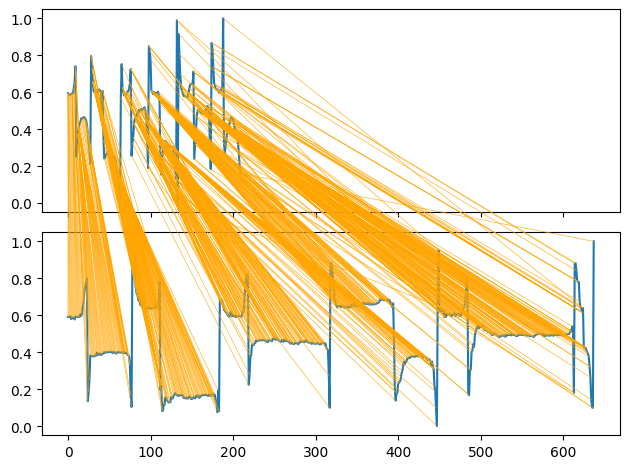

1.4897155439253076


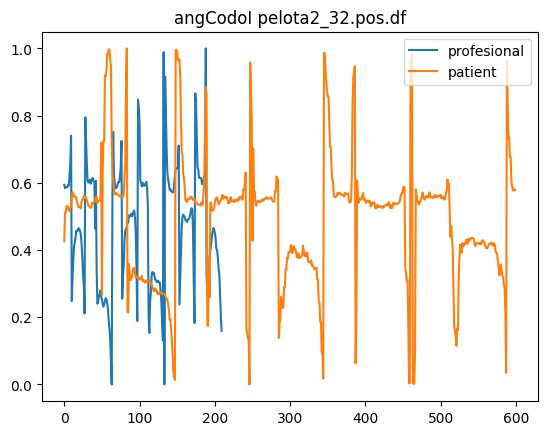

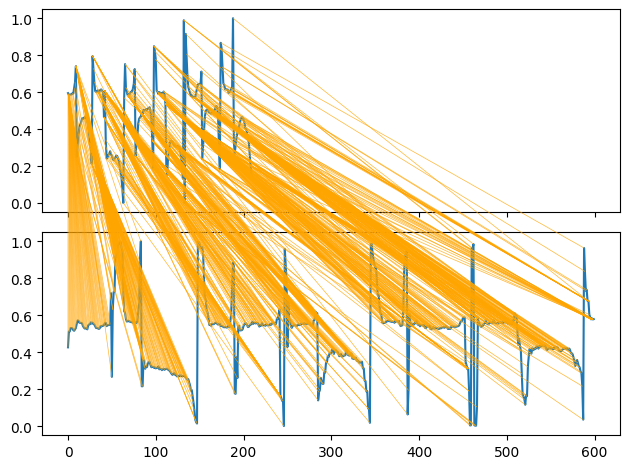

2.4104877446997754


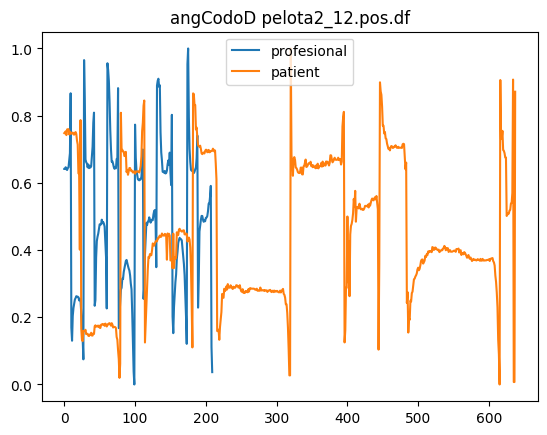

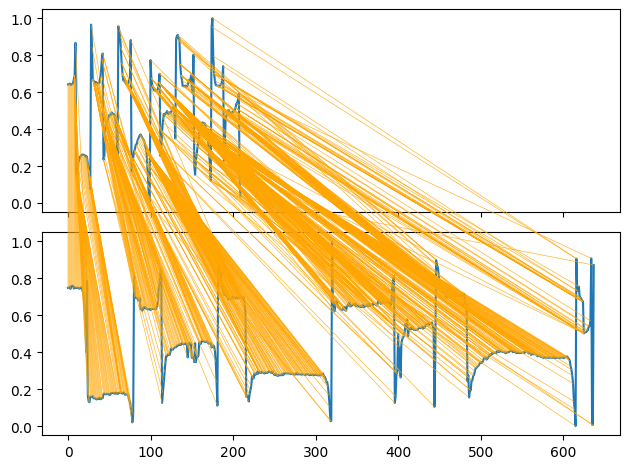

1.3469713273314048


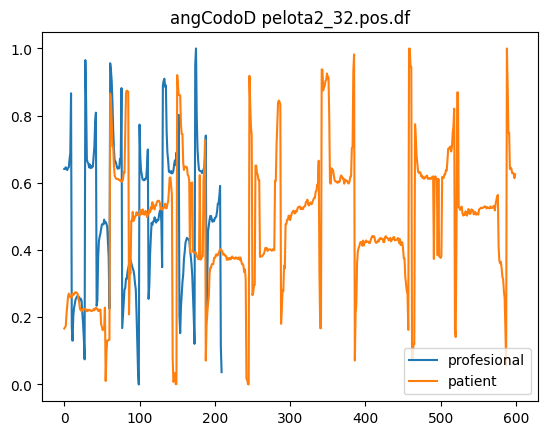

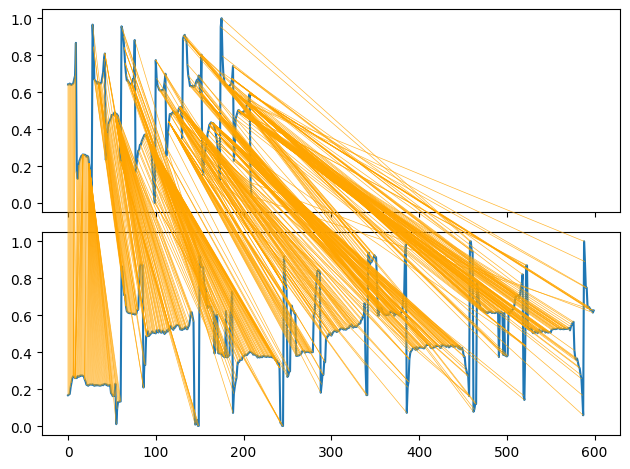

2.9229375500928914


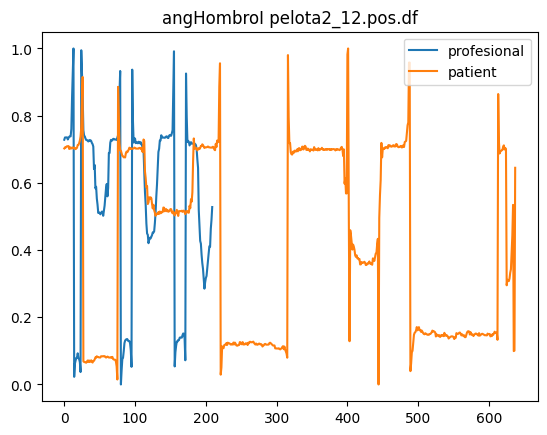

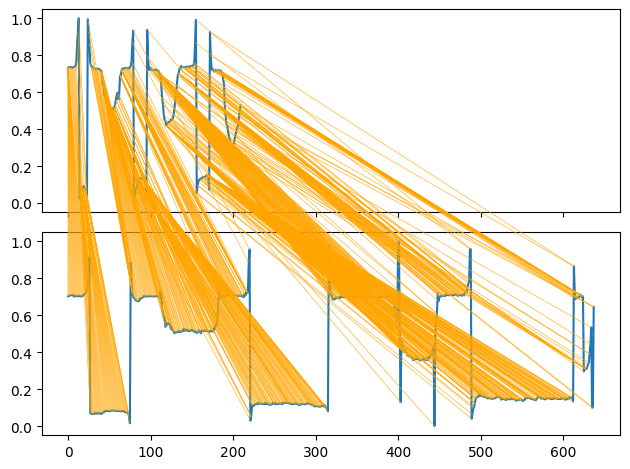

1.0603109237747081


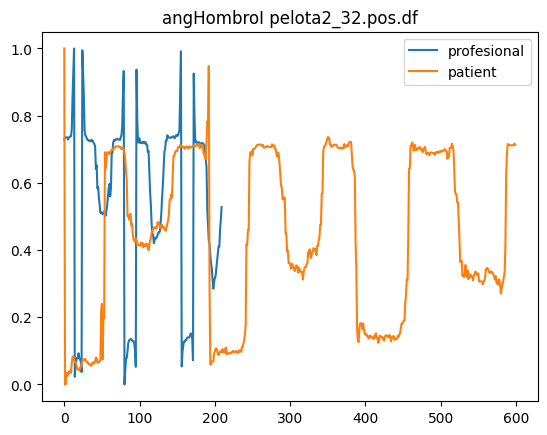

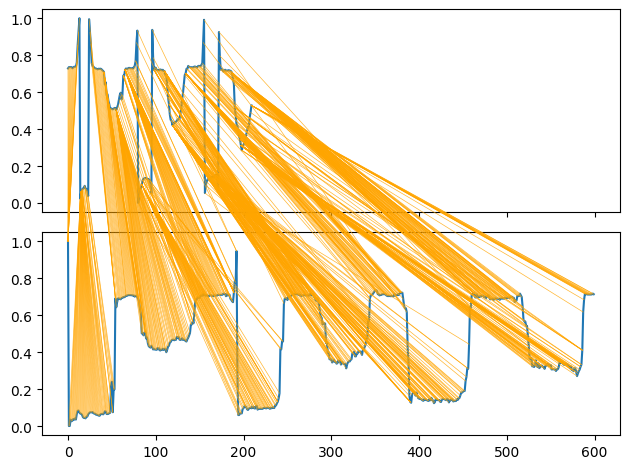

1.8257839042927926


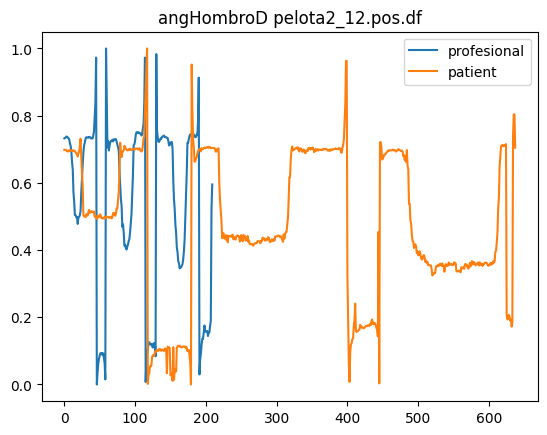

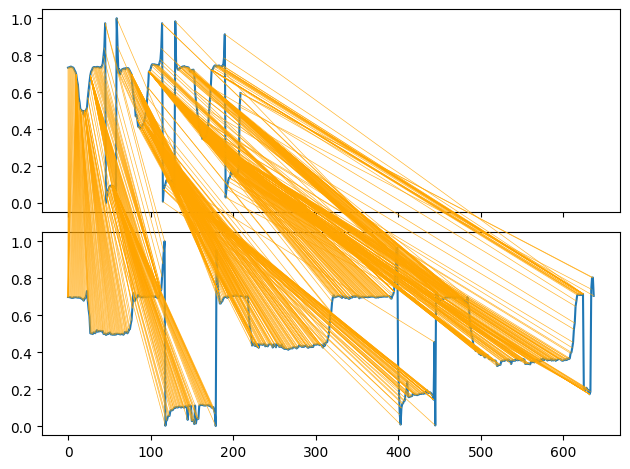

0.9001139086982568


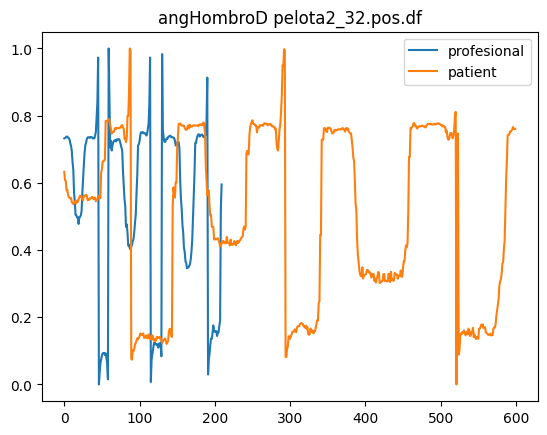

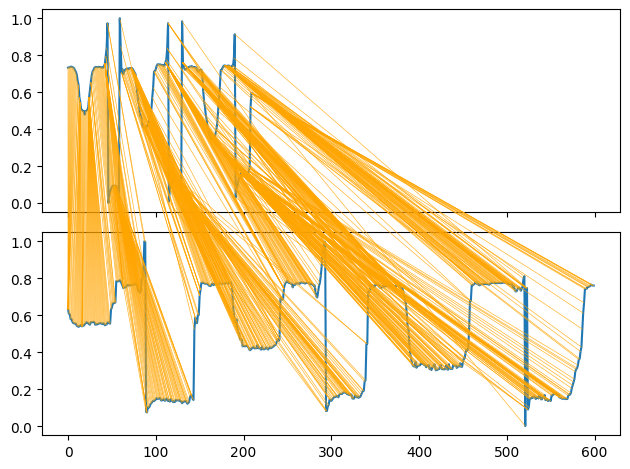

1.5061804715794609


In [115]:
for i in angles_pelota2:
    profesional_ej = None
    ej, profesional = next(iter(pelota2_profesionals.items()))
    profesional_ej = profesional[i]
    patient_ej = patient[i]
    
    for ej, patient in pelota2_patients.items():
        plt.plot(profesional_ej, label="profesional")
        plt.plot(patient[i], label="patient")
        plt.title(i + " " + ej)
        plt.legend()
        plt.show()

        distance, paths = dtw.warping_paths_fast(np.asarray(profesional_ej), np.asarray(patient[i]))
        best_path = dtw.best_path(paths)
        dtwvis.plot_warping(profesional_ej, patient[i], best_path)
        plt.show()

        print(distance)